# Minha análise exploratória - EDA

## 1. Preparação dos Dados

### Leitura dos dados

In [1]:
import pandas as pd
import numpy as np
import random
import sqlite3
from datetime import datetime

# entraddas dos dados
df_customers = pd.read_csv('dados/olist_customers_dataset.csv')
df_geolocation = pd.read_csv('dados/olist_geolocation_dataset.csv')
df_order_items = pd.read_csv('dados/olist_order_items_dataset.csv')
df_order_reviews = pd.read_csv('dados/olist_order_reviews_dataset.csv')
df_order_payments = pd.read_csv('dados/olist_order_payments_dataset.csv')
df_orders = pd.read_csv('dados/olist_orders_dataset.csv')
df_products = pd.read_csv('dados/olist_products_dataset.csv')
df_sellers = pd.read_csv('dados/olist_sellers_dataset.csv')
df_category_name_translation = pd.read_csv('dados/product_category_name_translation.csv')




#### Investigando os dados

In [41]:
# Criando um dicionário para facilitar o acesso
dataframes = {
    "customers": df_customers,
    "geolocation": df_geolocation,
    "order_items": df_order_items,
    "order_reviews": df_order_reviews,
    "order_payments": df_order_payments,
    "orders": df_orders,
    "products": df_products,
    "sellers": df_sellers,
    "category_name_translation": df_category_name_translation
}

# Loop para checar valores nulos e estrutura
for name, df in dataframes.items():
    print('- ' * 30)
    print(f"DataFrame: {name}")
    print('info:')
    print(df.info())
    print('Nulos: ')
    print(df.isnull().sum())
    print('- ' * 30)



- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
DataFrame: customers
info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 5 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   customer_id               99441 non-null  object
 1   customer_unique_id        99441 non-null  object
 2   customer_zip_code_prefix  99441 non-null  int64 
 3   customer_city             99441 non-null  object
 4   customer_state            99441 non-null  object
dtypes: int64(1), object(4)
memory usage: 3.8+ MB
None
Nulos: 
customer_id                 0
customer_unique_id          0
customer_zip_code_prefix    0
customer_city               0
customer_state              0
dtype: int64
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
DataFrame: geolocation
info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex:

#### Checando os nulos

- Dados nulos em order_reviews, orders, products vamos checar se afetarão a análise futuramente.

In [42]:
df_order_reviews.loc[df_order_reviews['review_comment_title'].isnull()]

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53
...,...,...,...,...,...,...,...
99219,574ed12dd733e5fa530cfd4bbf39d7c9,2a8c23fee101d4d5662fa670396eb8da,5,NaN,NaN,2018-07-07 00:00:00,2018-07-14 17:18:30
99220,f3897127253a9592a73be9bdfdf4ed7a,22ec9f0669f784db00fa86d035cf8602,5,NaN,NaN,2017-12-09 00:00:00,2017-12-11 20:06:42
99221,b3de70c89b1510c4cd3d0649fd302472,55d4004744368f5571d1f590031933e4,5,NaN,"Excelente mochila, entrega super rápida. Super...",2018-03-22 00:00:00,2018-03-23 09:10:43
99222,1adeb9d84d72fe4e337617733eb85149,7725825d039fc1f0ceb7635e3f7d9206,4,NaN,NaN,2018-07-01 00:00:00,2018-07-02 12:59:13


In [43]:
df_order_reviews.loc[df_order_reviews['review_comment_message'].isnull()]

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24
5,15197aa66ff4d0650b5434f1b46cda19,b18dcdf73be66366873cd26c5724d1dc,1,NaN,NaN,2018-04-13 00:00:00,2018-04-16 00:39:37
6,07f9bee5d1b850860defd761afa7ff16,e48aa0d2dcec3a2e87348811bcfdf22b,5,NaN,NaN,2017-07-16 00:00:00,2017-07-18 19:30:34
...,...,...,...,...,...,...,...
99217,c6b270c61f67c9f7cb07d84ea8aeaf8b,48f7ee67313eda32bfcf5b9c1dd9522d,5,NaN,NaN,2017-12-13 00:00:00,2017-12-14 11:09:36
99218,af2dc0519de6e0720ef0c74292fb4114,d699c734a0b1c8111f2272a3f36d398c,5,NaN,NaN,2018-04-27 00:00:00,2018-04-30 01:18:57
99219,574ed12dd733e5fa530cfd4bbf39d7c9,2a8c23fee101d4d5662fa670396eb8da,5,NaN,NaN,2018-07-07 00:00:00,2018-07-14 17:18:30
99220,f3897127253a9592a73be9bdfdf4ed7a,22ec9f0669f784db00fa86d035cf8602,5,NaN,NaN,2017-12-09 00:00:00,2017-12-11 20:06:42


- Em order_reviews os nulos não afetarão nossos resultados e poderemos substituí-los futuramente

In [44]:
print(df_orders.isnull().sum())

order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                 160
order_delivered_carrier_date     1783
order_delivered_customer_date    2965
order_estimated_delivery_date       0
dtype: int64


In [45]:
df_orders.order_status.loc[df_orders['order_delivered_customer_date'].isnull()].value_counts() # há 8 nulos com status 'delivered'

order_status
shipped        1107
canceled        619
unavailable     609
invoiced        314
processing      301
delivered         8
created           5
approved          2
Name: count, dtype: int64

In [46]:
df_orders.order_status.loc[df_orders['order_delivered_customer_date'].notnull()].value_counts() # há 6 pedidos com status 'canceled' mas com data de entrega

order_status
delivered    96470
canceled         6
Name: count, dtype: int64

- Em df_orders os valores nulos são referentes aos pedidos não ter não terem sido entregues.

In [47]:
df_products.isnull().sum()

product_id                      0
product_category_name         610
product_name_lenght           610
product_description_lenght    610
product_photos_qty            610
product_weight_g                2
product_length_cm               2
product_height_cm               2
product_width_cm                2
dtype: int64

In [48]:
df_products.loc[df_products['product_category_name'].isnull()] # Produtos sem nome de categoria

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
105,a41e356c76fab66334f36de622ecbd3a,NaN,NaN,NaN,NaN,650.0,17.0,14.0,12.0
128,d8dee61c2034d6d075997acef1870e9b,NaN,NaN,NaN,NaN,300.0,16.0,7.0,20.0
145,56139431d72cd51f19eb9f7dae4d1617,NaN,NaN,NaN,NaN,200.0,20.0,20.0,20.0
154,46b48281eb6d663ced748f324108c733,NaN,NaN,NaN,NaN,18500.0,41.0,30.0,41.0
197,5fb61f482620cb672f5e586bb132eae9,NaN,NaN,NaN,NaN,300.0,35.0,7.0,12.0
...,...,...,...,...,...,...,...,...,...
32515,b0a0c5dd78e644373b199380612c350a,NaN,NaN,NaN,NaN,1800.0,30.0,20.0,70.0
32589,10dbe0fbaa2c505123c17fdc34a63c56,NaN,NaN,NaN,NaN,800.0,30.0,10.0,23.0
32616,bd2ada37b58ae94cc838b9c0569fecd8,NaN,NaN,NaN,NaN,200.0,21.0,8.0,16.0
32772,fa51e914046aab32764c41356b9d4ea4,NaN,NaN,NaN,NaN,1300.0,45.0,16.0,45.0


In [49]:
df_products.loc[df_products['product_category_name'].notnull()]

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0
...,...,...,...,...,...,...,...,...,...
32946,a0b7d5a992ccda646f2d34e418fff5a0,moveis_decoracao,45.0,67.0,2.0,12300.0,40.0,40.0,40.0
32947,bf4538d88321d0fd4412a93c974510e6,construcao_ferramentas_iluminacao,41.0,971.0,1.0,1700.0,16.0,19.0,16.0
32948,9a7c6041fa9592d9d9ef6cfe62a71f8c,cama_mesa_banho,50.0,799.0,1.0,1400.0,27.0,7.0,27.0
32949,83808703fc0706a22e264b9d75f04a2e,informatica_acessorios,60.0,156.0,2.0,700.0,31.0,13.0,20.0


In [50]:
print(df_products.shape)
print(df_products.product_id.unique().shape) # todos produtos com id único

(32951, 9)
(32951,)


#### Resumo


- Em primeira instância, os valores nulos não irão afetar nossas análises, portanto, não iremos manipulá-los.

### Relacionando os DataFrames

In [51]:
from IPython.display import Image
display(Image(url="dados/modelo_relacional.png", width=1000, height=500)) 

In [52]:
conn = sqlite3.connect('olist.db')  # se conectando com o banco

In [53]:
# criando as tabelas usando as informações do kaggle

conn.execute("""CREATE TABLE IF NOT EXISTS geolocation (
    geolocation_zip_code_prefix TEXT PRIMARY KEY,
    geolocation_lat FLOAT,
    geolocation_lng FLOAT,
    geolocation_city TEXT,
    geolocation_state TEXT
);
""")


conn.execute("""CREATE TABLE IF NOT EXISTS sellers (
    seller_id TEXT PRIMARY KEY,
    seller_zip_code_prefix INTEGER,
    seller_city TEXT,
    seller_state TEXT,
    FOREIGN KEY (seller_zip_code_prefix) REFERENCES geolocation(geolocation_zip_code_prefix)
);
""")


conn.execute("""CREATE TABLE IF NOT EXISTS customers (
    customer_id TEXT PRIMARY KEY,
    customer_unique_id TEXT,
    customer_zip_code_prefix INTEGER,
    customer_city TEXT,
    customer_state TEXT,
    FOREIGN KEY (customer_zip_code_prefix) REFERENCES geolocation(geolocation_zip_code_prefix)
);
""")


conn.execute("""CREATE TABLE IF NOT EXISTS products (
    product_id TEXT PRIMARY KEY,
    product_category_name TEXT,
    product_name_length INTEGER,
    product_description_length INTEGER,
    product_photos_qty INTEGER,
    product_weight_g INTEGER,
    product_length_cm INTEGER,
    product_height_cm INTEGER,
    product_width_cm INTEGER
);
""")


conn.execute("""CREATE TABLE IF NOT EXISTS category_translation (
    product_category_name TEXT PRIMARY KEY,
    product_category_name_english TEXT
);
""")


conn.execute("""CREATE TABLE IF NOT EXISTS orders (
    order_id TEXT PRIMARY KEY,
    customer_id TEXT,
    order_status TEXT,
    order_purchase_timestamp TEXT,
    order_approved_at TEXT,
    order_delivered_carrier_date TEXT,
    order_delivered_customer_date TEXT,
    order_estimated_delivery_date TEXT,
    FOREIGN KEY (customer_id) REFERENCES customers(customer_id)
);
""")


conn.execute("""CREATE TABLE IF NOT EXISTS order_items (
    order_id TEXT,
    order_item_id INTEGER,
    product_id TEXT,
    seller_id TEXT,
    shipping_limit_date TEXT,
    price REAL,
    freight_value REAL,
    PRIMARY KEY (order_id, order_item_id),
    FOREIGN KEY (order_id) REFERENCES orders(order_id),
    FOREIGN KEY (product_id) REFERENCES products(product_id),
    FOREIGN KEY (seller_id) REFERENCES sellers(seller_id)
);
""")


conn.execute("""CREATE TABLE IF NOT EXISTS order_payments (
    order_id TEXT,
    payment_sequential INTEGER,
    payment_type TEXT,
    payment_installments INTEGER,
    payment_value FLOAT,
    PRIMARY KEY (order_id, payment_sequential),
    FOREIGN KEY (order_id) REFERENCES orders(order_id)
);
""")


conn.execute("""CREATE TABLE IF NOT EXISTS order_reviews (
    review_id TEXT PRIMARY KEY,
    order_id TEXT,
    review_score INTEGER,
    review_comment_title TEXT,
    review_comment_message TEXT,
    review_creation_date TEXT,
    review_answer_timestamp TEXT,
    FOREIGN KEY (order_id) REFERENCES orders(order_id)
);

""")

# ativando chave estrangeira
conn.execute("PRAGMA foreign_keys = ON;")


In [54]:
# alimentando o banco de dados 
df_geolocation.to_sql('geolocation', conn,if_exists='replace',index=False)
df_sellers.to_sql('sellers', conn,if_exists='replace',index=False)
df_customers.to_sql('customers', conn,if_exists='replace',index=False)
df_products.to_sql('products', conn,if_exists='replace',index=False)
df_category_name_translation.to_sql('category_translation', conn,if_exists='replace',index=False)
df_orders.to_sql('orders', conn,if_exists='replace',index=False)
df_order_items.to_sql('order_items', conn,if_exists='replace',index=False)
df_order_payments.to_sql('order_payments', conn,if_exists='replace',index=False)
df_order_reviews.to_sql('order_reviews', conn,if_exists='replace',index=False)


99224

In [55]:
# teste simples na conexão
query = "SELECT * FROM orders LIMIT 5"
df_test = pd.read_sql(query, conn)
display(df_test)
conn.close()


,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00


In [56]:
# Montando a tabela completa com os dados das vendas
df_vendas = df_orders.merge(df_order_items, on='order_id') \
                            .merge(df_customers, on='customer_id') \
                            .merge(df_order_payments, on='order_id') \
                            .merge(df_order_reviews, on='order_id') \
                            .merge(df_products, on='product_id') \
                            .merge(df_sellers, on='seller_id') \


display(df_vendas.head(10))

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,...,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_zip_code_prefix,seller_city,seller_state
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,1,87285b34884572647811a353c7ac498a,...,40.0,268.0,4.0,500.0,19.0,8.0,13.0,9350,maua,SP
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,1,87285b34884572647811a353c7ac498a,...,40.0,268.0,4.0,500.0,19.0,8.0,13.0,9350,maua,SP
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,1,87285b34884572647811a353c7ac498a,...,40.0,268.0,4.0,500.0,19.0,8.0,13.0,9350,maua,SP
3,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,1,595fac2a385ac33a80bd5114aec74eb8,...,29.0,178.0,1.0,400.0,19.0,13.0,19.0,31570,belo horizonte,SP
4,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00,1,aa4383b373c6aca5d8797843e5594415,...,46.0,232.0,1.0,420.0,24.0,19.0,21.0,14840,guariba,SP
5,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00,1,d0b61bfb1de832b15ba9d266ca96e5b0,...,59.0,468.0,3.0,450.0,30.0,10.0,20.0,31842,belo horizonte,MG
6,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00,1,65266b2da20d04dbe00c5c2d3bb7859e,...,38.0,316.0,4.0,250.0,51.0,15.0,15.0,8752,mogi das cruzes,SP
7,a4591c265e18cb1dcee52889e2d8acc3,503740e9ca751ccdda7ba28e9ab8f608,delivered,2017-07-09 21:57:05,2017-07-09 22:10:13,2017-07-11 14:58:04,2017-07-26 10:57:55,2017-08-01 00:00:00,1,060cb19345d90064d1015407193c233d,...,49.0,608.0,1.0,7150.0,65.0,10.0,65.0,7112,guarulhos,SP
8,136cce7faa42fdb2cefd53fdc79a6098,ed0271e0b7da060a393796590e7b737a,invoiced,2017-04-11 12:22:08,2017-04-13 13:25:17,NaN,NaN,2017-05-09 00:00:00,1,a1804276d9941ac0733cfd409f5206eb,...,NaN,NaN,NaN,600.0,35.0,35.0,15.0,5455,sao paulo,SP
9,6514b8ad8028c9f2cc2374ded245783f,9bdf08b4b3b52b5526ff42d37d47f222,delivered,2017-05-16 13:10:30,2017-05-16 13:22:11,2017-05-22 10:07:46,2017-05-26 12:55:51,2017-06-07 00:00:00,1,4520766ec412348b8d4caa5e8a18c464,...,59.0,956.0,1.0,50.0,16.0,16.0,17.0,12940,atibaia,SP


In [57]:
df_vendas.shape

(117329, 39)

In [58]:
df_vendas.order_id.value_counts()

order_id
895ab968e7bb0d5659d16cd74cd1650c    63
fedcd9f7ccdc8cba3a18defedd1a5547    38
fa65dad1b0e818e3ccc5cb0e39231352    29
ccf804e764ed5650cd8759557269dc13    26
465c2e1bee4561cb39e0db8c5993aafc    24
                                    ..
59a5648d91a60574c541152e2fe1c66c     1
dcb668b21e7c36224624fc4b4ddbf0fd     1
a8715df62ddbba56b77f5ac4ecf71d4f     1
c6bf66e37e4bdab5ad532291c72a1d71     1
66dea50a8b16d9b4dee7af250b4be1a5     1
Name: count, Length: 97916, dtype: int64

### Pausa para descrever os passos até aqui, e identificar para onde vamos
- Identificamos os nulos
- Verificamos os relacionamentos dos dados
- Agora vamos responder perguntas com os dados

## 2. Análise Exploratória de Dados

### a) Qual o volume de pedidos por mês? Existe sazonalidade nas vendas?

Para responder essa pergunta vou utilizar técnicas de decomposição de séries temporais.<br>
Técnicas aprendidas com professor Fernando Amaral e complementado com materiais acadêmicos.

In [59]:
import plotly.express as px
from statsmodels.tsa.seasonal import seasonal_decompose
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

In [60]:
conn = sqlite3.connect('olist.db')
query = '''
SELECT 
    strftime('%Y-%m', order_purchase_timestamp) AS Mês,
    COUNT(DISTINCT order_id) AS Pedidos
FROM orders
GROUP BY Mês
ORDER BY Mês;
'''

df_orders_por_mes = pd.read_sql_query(query, conn)
display(df_orders_por_mes)
conn.close()


,Mês,Pedidos
0,2016-09,4
1,2016-10,324
2,2016-12,1
3,2017-01,800
4,2017-02,1780
5,2017-03,2682
6,2017-04,2404
7,2017-05,3700
8,2017-06,3245
9,2017-07,4026


No seguinte gráfico vamos observar a quantidade de pedidos por mês.

In [61]:
# gráfico de barras
fig = px.bar(
    df_orders_por_mes,
    x='Mês',
    y='Pedidos'
)

# layout
fig.update_layout(
    title=dict(text='Volume de pedidos por mês',y=0.95,x=0.5,xanchor='center',yanchor='top'),
    xaxis=dict(title='', tickangle=-45, showgrid=True),
    yaxis=dict(title='Volume de vendas', showgrid=True,range = [0,df_orders_por_mes['Pedidos'].max()*1.1]),
    font=dict(family='Arial', size=14),
    plot_bgcolor='white',
    width=1200, height=500
)

# rótulos nos dados
fig.update_traces(
    text=df_orders_por_mes['Pedidos'],
    textposition='outside',
    hovertemplate='%{x}<br>Quantidade: %{y}'
)

fig.show()

Nos gráficos a seguir, vou observar a sazonalidade e a tendência.<br>
<i>(Não foi solicitado a tendência, mas já que estou com essa base e é notória a tendência, quero vizualizar na decomposição.)</i>

In [62]:
df_orders_por_mes['Mês'] = pd.to_datetime(df_orders_por_mes['Mês'])

df_orders_por_mes

,Mês,Pedidos
0,2016-09-01,4
1,2016-10-01,324
2,2016-12-01,1
3,2017-01-01,800
4,2017-02-01,1780
5,2017-03-01,2682
6,2017-04-01,2404
7,2017-05-01,3700
8,2017-06-01,3245
9,2017-07-01,4026


In [63]:
# Aqui vou iniciar a decomposição da série temporal
st = df_orders_por_mes.set_index('Mês').resample('ME').sum()
decomposicao = seasonal_decompose(st, model='additive')  

# nesse grafico vou visualizar a sazonalidade da série
sazonalidade = decomposicao.seasonal
sazonalidade.name = 'Sazonalidade'
# série temporal
fig = px.line(
    sazonalidade
)

# layout
fig.update_layout(
    title=dict(text='Sazonalidade das Vendas',y=0.9,x=0.5,xanchor='center',yanchor='top'),
    xaxis=dict(title='',tickangle=-45,tickformat='%m-%Y',gridcolor='lightgrey'),
    yaxis=dict(title='',gridcolor='lightgrey',zerolinecolor='lightgrey'),
    legend=dict(title='Legenda',yanchor='bottom',y=1.0,xanchor='right',x=1),
    font=dict(family='Arial',size=14),
    plot_bgcolor='white',
    width=1200, height=500
)

# rótulos nos dados
fig.update_traces(
    mode='lines+markers', 
    marker=dict(size=6),
    text=sazonalidade.round(0),
    textposition='top center',
    hovertemplate='%{x}<br>Valor: %{y:.0f}'
)

fig.show()

In [64]:
# nesse grafico vou visualizar a tendencia da série
tendencia = decomposicao.trend.dropna()
tendencia.name = 'Tendência'
# série temporal
fig = px.line(
    tendencia.dropna()
)

# layout
fig.update_layout(
    title=dict(text='Tendência das Vendas',y=0.9,x=0.5,xanchor='center',yanchor='top'),
    xaxis=dict(title='',tickangle=-45,tickformat='%m-%Y',gridcolor='lightgrey'), 
    yaxis=dict(title='',gridcolor='lightgrey'),
    legend=dict(title='Legenda',orientation='h',yanchor='bottom',y=1.02,xanchor='right',x=1),
    font=dict(family='Arial',size=14),
    plot_bgcolor='white',
    width=1200, height=500
)

# rótulos nas barras
fig.update_traces(
    mode='lines+markers',  
    marker=dict(size=6),
    text=tendencia.dropna().round(0),
    textposition='top center',
    hovertemplate='%{x}<br>Valor: %{y:.0f}'
)

fig.show()


### <b>Resposta da pergunta A</b>

Qual o volume de pedidos por mês?
- <i>A quantidade por mês mostrei no grafica de barras.</i>

Existe sazonalidade nas vendas?
- <i>Sim! Quando visto em quantidade de vendas mês a mês, é notavel a tendência. Mas somente após aplicar técnicas de decomposição de séries temporais que pude ver a `sazonalidade` com pico de vendas em `Novembro de 2017` apesar de não temos os dados de `Novembro de 2016` ou `Novembro de 2018` para confimar. </i>

### b) Qual a distribuição do tempo de entrega dos pedidos?

Para responder essa pergunta vou precisar criar uma coluna com o tempo de entrega e criar um histograma.

In [65]:
conn = sqlite3.connect('olist.db')
query = '''
SELECT 
    JULIANDAY(order_delivered_customer_date) - JULIANDAY(order_purchase_timestamp) AS tempo_entrega,
    JULIANDAY(order_estimated_delivery_date) - JULIANDAY(order_purchase_timestamp) AS tempo_estimado
FROM orders
WHERE order_delivered_customer_date IS NOT NULL;
'''

df_delivery = pd.read_sql_query(query, conn)
display(df_delivery)
conn.close()


,tempo_entrega,tempo_estimado
0,8.436574,15.544062
1,13.782037,19.137766
2,9.394213,26.639711
3,13.208750,26.188819
4,2.873877,12.112049
...,...,...
96471,8.218009,18.587442
96472,22.193727,23.459051
96473,24.859421,30.384225
96474,17.086424,37.105243


In [66]:
df_delivery['estimado_vs_realizado'] = df_delivery['tempo_entrega']-df_delivery['tempo_estimado']
df_delivery

,tempo_entrega,tempo_estimado,estimado_vs_realizado
0,8.436574,15.544062,-7.107488
1,13.782037,19.137766,-5.355729
2,9.394213,26.639711,-17.245498
3,13.208750,26.188819,-12.980069
4,2.873877,12.112049,-9.238171
...,...,...,...
96471,8.218009,18.587442,-10.369433
96472,22.193727,23.459051,-1.265324
96473,24.859421,30.384225,-5.524803
96474,17.086424,37.105243,-20.018819


In [67]:
# vou renomear para visualizar melhor
# em outro dataframe para não manipula o df original que posso precisar futuramente
df_hist = df_delivery[['tempo_entrega','estimado_vs_realizado']].rename(columns={
    'tempo_entrega': 'Tempo de entrega realizada (Dias)',
    'estimado_vs_realizado': 'Diferença realizada x estimada (Dias)'
})

fig = px.histogram(
    df_hist,
    nbins=int(df_hist['Tempo de entrega realizada (Dias)'].max())
)

fig.update_layout(
    title=dict(text='Distribuição do tempo de entrega', y=0.9, x=0.5, xanchor='center', yanchor='top'),
    xaxis=dict(title='Tempo de entrega (Dias)', tickangle=-45, showgrid=True, zerolinecolor='lightgrey'),
    yaxis=dict(title='Quantidade de pedidos', showgrid=True),
    font=dict(family='Arial', size=14),
    legend=dict(title='Legenda', orientation='v', yanchor='bottom', y=0.7, xanchor='right',x=1.4),
    plot_bgcolor='white',
    barmode='overlay', 
    bargap=0.1,
    annotations=[
        dict(
            text=f"90% dos pedidos foram entregues até {abs(df_hist['Diferença realizada x estimada (Dias)'].quantile(0.90)):.0f} dias antes do previsto",
            xref='paper', yref='paper',
            x=1.4, y=0.5,  
            showarrow=False,
            font=dict(size=15, color='gray'),
            align='center',
            bgcolor='rgba(255, 255, 255, 1)',  
            bordercolor='lightgray',
            borderwidth=1
        ),
        dict(
            text=f"90% dos pedidos foram entregues em até {df_hist['Tempo de entrega realizada (Dias)'].quantile(0.90):.0f} dias",
            xref='paper', yref='paper',
            x=1.4, y=0.42, 
            showarrow=False,
            font=dict(size=15, color='gray'),
            align='center',
            bgcolor='rgba(255, 255, 255, 1)', 
            bordercolor='lightgray',
            borderwidth=1
        )
    ],
    width=1200, height=500
)
fig.update_traces(
    opacity=0.6
    )

fig.show()

### <b>Resposta da pergunta B</b>

Qual a distribuição do tempo de entrega dos pedidos?<br>
- <i>90% dos pedidos foram entregues em até 23 dias</i>
- <i>90% dos pedidos foram entregues em até 1 dia antes do previsto</i>

### c) Qual a relação entre o valor do frete e a distância de entrega?

Para responder essa pergunta, vou criar um indicador de distancia, e depois observar o correlação com o valor do frete

<i>(Após realizar a análise resolvi colocar outras informações que poderia ter maior influiencia.)</i>

In [68]:
conn = sqlite3.connect('olist.db')
query = '''
SELECT 
    o.order_id,
    oi.order_item_id,
    c.customer_id,
    c.customer_zip_code_prefix,
    p.product_id,
    p.product_weight_g,
    p.product_length_cm,
    p.product_height_cm,
    p.product_width_cm,
    s.seller_id,
    s.seller_zip_code_prefix,
    oi.freight_value,
    gs.seller_lat,
    gs.seller_lng,
    gc.customer_lat,
    gc.customer_lng
FROM orders AS o
JOIN order_items AS oi ON o.order_id = oi.order_id
JOIN customers AS c ON o.customer_id = c.customer_id
JOIN products AS p ON oi.product_id = p.product_id
JOIN sellers AS s ON oi.seller_id = s.seller_id
LEFT JOIN (
    SELECT geolocation_zip_code_prefix, 
           AVG(geolocation_lat) AS seller_lat, 
           AVG(geolocation_lng) AS seller_lng
    FROM geolocation
    GROUP BY geolocation_zip_code_prefix
) AS gs ON s.seller_zip_code_prefix = gs.geolocation_zip_code_prefix
LEFT JOIN (
    SELECT geolocation_zip_code_prefix, 
           AVG(geolocation_lat) AS customer_lat, 
           AVG(geolocation_lng) AS customer_lng
    FROM geolocation
    GROUP BY geolocation_zip_code_prefix
) AS gc ON c.customer_zip_code_prefix = gc.geolocation_zip_code_prefix
;
'''

df_freight = pd.read_sql_query(query, conn)
display(df_freight)
conn.close()

,order_id,order_item_id,customer_id,customer_zip_code_prefix,product_id,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_id,seller_zip_code_prefix,freight_value,seller_lat,seller_lng,customer_lat,customer_lng
0,e481f51cbdc54678b7cc49136f2d6af7,1,9ef432eb6251297304e76186b10a928d,3149,87285b34884572647811a353c7ac498a,500.0,19.0,8.0,13.0,3504c0cb71d7fa48d967e0e4c94d59d9,9350,8.72,-23.680729,-46.444238,-23.576983,-46.587161
1,53cdb2fc8bc7dce0b6741e2150273451,1,b0830fb4747a6c6d20dea0b8c802d7ef,47813,595fac2a385ac33a80bd5114aec74eb8,400.0,19.0,13.0,19.0,289cdb325fb7e7f891c38608bf9e0962,31570,22.76,-19.807681,-43.980427,-12.177924,-44.660711
2,47770eb9100c2d0c44946d9cf07ec65d,1,41ce2a54c0b03bf3443c3d931a367089,75265,aa4383b373c6aca5d8797843e5594415,420.0,24.0,19.0,21.0,4869f7a5dfa277a7dca6462dcf3b52b2,14840,19.22,-21.363502,-48.229601,-16.745150,-48.514783
3,949d5b44dbf5de918fe9c16f97b45f8a,1,f88197465ea7920adcdbec7375364d82,59296,d0b61bfb1de832b15ba9d266ca96e5b0,450.0,30.0,10.0,20.0,66922902710d126a0e7d26b0e3805106,31842,27.20,-19.837682,-43.924053,-5.774190,-35.271143
4,ad21c59c0840e6cb83a9ceb5573f8159,1,8ab97904e6daea8866dbdbc4fb7aad2c,9195,65266b2da20d04dbe00c5c2d3bb7859e,250.0,51.0,15.0,15.0,2c9e548be18521d1c43cde1c582c6de8,8752,8.72,-23.543395,-46.262086,-23.676370,-46.514627
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112645,63943bddc261676b46f01ca7ac2f7bd8,1,1fca14ff2861355f6e5f14306ff977a7,11722,f1d4ce8c6dd66c47bbaa8c6781c2a923,4950.0,40.0,10.0,40.0,1f9ab4708f3056ede07124aad39a2554,17602,20.10,-21.930548,-50.498348,-24.001500,-46.449864
112646,83c1379a015df1e13d02aae0204711ab,1,1aa71eb042121263aafbe80c1b562c9c,45920,b80910977a37536adeddd63663f916ad,13300.0,32.0,90.0,22.0,d50d79cb34e38265a8649c383dcffd48,8290,65.02,-23.553642,-46.452661,-17.898358,-39.373630
112647,11c177c8e97725db2631073c19f07b62,1,b331b74b18dc79bcdf6532d51e1637c1,28685,d1c427060a0f73f6b889a5c7c61f2ac4,6550.0,20.0,20.0,20.0,a1043bafd471dff536d0c462352beb48,37175,40.59,-20.940578,-45.827237,-22.562825,-42.694574
112648,11c177c8e97725db2631073c19f07b62,2,b331b74b18dc79bcdf6532d51e1637c1,28685,d1c427060a0f73f6b889a5c7c61f2ac4,6550.0,20.0,20.0,20.0,a1043bafd471dff536d0c462352beb48,37175,40.59,-20.940578,-45.827237,-22.562825,-42.694574


In [69]:
#pip install haversine

In [70]:
# pensei em extrair o indicador de distância via API, mas o custo seria muito alto
# então vou usar a fórmula de haversine para calcular a distância entre dois pontos na superfície da Terra
# não fornece a distância exata, mas é o que tenho por enquanto

from haversine import haversine
df_freight['freight_distance'] = df_freight.apply(lambda row: haversine((row['customer_lat'], row['customer_lng']),( row['seller_lat'], row['seller_lng'])),axis=1)
df_freight[['freight_distance','freight_value']].head(10)
df_freight['cubic_meters_cm'] = df_freight['product_length_cm'] * df_freight['product_height_cm'] * df_freight['product_width_cm'] / 1000000
df_freight


,order_id,order_item_id,customer_id,customer_zip_code_prefix,product_id,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_id,seller_zip_code_prefix,freight_value,seller_lat,seller_lng,customer_lat,customer_lng,freight_distance,cubic_meters_cm
0,e481f51cbdc54678b7cc49136f2d6af7,1,9ef432eb6251297304e76186b10a928d,3149,87285b34884572647811a353c7ac498a,500.0,19.0,8.0,13.0,3504c0cb71d7fa48d967e0e4c94d59d9,9350,8.72,-23.680729,-46.444238,-23.576983,-46.587161,18.576135,0.001976
1,53cdb2fc8bc7dce0b6741e2150273451,1,b0830fb4747a6c6d20dea0b8c802d7ef,47813,595fac2a385ac33a80bd5114aec74eb8,400.0,19.0,13.0,19.0,289cdb325fb7e7f891c38608bf9e0962,31570,22.76,-19.807681,-43.980427,-12.177924,-44.660711,851.496245,0.004693
2,47770eb9100c2d0c44946d9cf07ec65d,1,41ce2a54c0b03bf3443c3d931a367089,75265,aa4383b373c6aca5d8797843e5594415,420.0,24.0,19.0,21.0,4869f7a5dfa277a7dca6462dcf3b52b2,14840,19.22,-21.363502,-48.229601,-16.745150,-48.514783,514.411377,0.009576
3,949d5b44dbf5de918fe9c16f97b45f8a,1,f88197465ea7920adcdbec7375364d82,59296,d0b61bfb1de832b15ba9d266ca96e5b0,450.0,30.0,10.0,20.0,66922902710d126a0e7d26b0e3805106,31842,27.20,-19.837682,-43.924053,-5.774190,-35.271143,1822.228853,0.006000
4,ad21c59c0840e6cb83a9ceb5573f8159,1,8ab97904e6daea8866dbdbc4fb7aad2c,9195,65266b2da20d04dbe00c5c2d3bb7859e,250.0,51.0,15.0,15.0,2c9e548be18521d1c43cde1c582c6de8,8752,8.72,-23.543395,-46.262086,-23.676370,-46.514627,29.676666,0.011475
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112645,63943bddc261676b46f01ca7ac2f7bd8,1,1fca14ff2861355f6e5f14306ff977a7,11722,f1d4ce8c6dd66c47bbaa8c6781c2a923,4950.0,40.0,10.0,40.0,1f9ab4708f3056ede07124aad39a2554,17602,20.10,-21.930548,-50.498348,-24.001500,-46.449864,474.120691,0.016000
112646,83c1379a015df1e13d02aae0204711ab,1,1aa71eb042121263aafbe80c1b562c9c,45920,b80910977a37536adeddd63663f916ad,13300.0,32.0,90.0,22.0,d50d79cb34e38265a8649c383dcffd48,8290,65.02,-23.553642,-46.452661,-17.898358,-39.373630,967.848633,0.063360
112647,11c177c8e97725db2631073c19f07b62,1,b331b74b18dc79bcdf6532d51e1637c1,28685,d1c427060a0f73f6b889a5c7c61f2ac4,6550.0,20.0,20.0,20.0,a1043bafd471dff536d0c462352beb48,37175,40.59,-20.940578,-45.827237,-22.562825,-42.694574,370.404994,0.008000
112648,11c177c8e97725db2631073c19f07b62,2,b331b74b18dc79bcdf6532d51e1637c1,28685,d1c427060a0f73f6b889a5c7c61f2ac4,6550.0,20.0,20.0,20.0,a1043bafd471dff536d0c462352beb48,37175,40.59,-20.940578,-45.827237,-22.562825,-42.694574,370.404994,0.008000


In [71]:
df_freight

,order_id,order_item_id,customer_id,customer_zip_code_prefix,product_id,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_id,seller_zip_code_prefix,freight_value,seller_lat,seller_lng,customer_lat,customer_lng,freight_distance,cubic_meters_cm
0,e481f51cbdc54678b7cc49136f2d6af7,1,9ef432eb6251297304e76186b10a928d,3149,87285b34884572647811a353c7ac498a,500.0,19.0,8.0,13.0,3504c0cb71d7fa48d967e0e4c94d59d9,9350,8.72,-23.680729,-46.444238,-23.576983,-46.587161,18.576135,0.001976
1,53cdb2fc8bc7dce0b6741e2150273451,1,b0830fb4747a6c6d20dea0b8c802d7ef,47813,595fac2a385ac33a80bd5114aec74eb8,400.0,19.0,13.0,19.0,289cdb325fb7e7f891c38608bf9e0962,31570,22.76,-19.807681,-43.980427,-12.177924,-44.660711,851.496245,0.004693
2,47770eb9100c2d0c44946d9cf07ec65d,1,41ce2a54c0b03bf3443c3d931a367089,75265,aa4383b373c6aca5d8797843e5594415,420.0,24.0,19.0,21.0,4869f7a5dfa277a7dca6462dcf3b52b2,14840,19.22,-21.363502,-48.229601,-16.745150,-48.514783,514.411377,0.009576
3,949d5b44dbf5de918fe9c16f97b45f8a,1,f88197465ea7920adcdbec7375364d82,59296,d0b61bfb1de832b15ba9d266ca96e5b0,450.0,30.0,10.0,20.0,66922902710d126a0e7d26b0e3805106,31842,27.20,-19.837682,-43.924053,-5.774190,-35.271143,1822.228853,0.006000
4,ad21c59c0840e6cb83a9ceb5573f8159,1,8ab97904e6daea8866dbdbc4fb7aad2c,9195,65266b2da20d04dbe00c5c2d3bb7859e,250.0,51.0,15.0,15.0,2c9e548be18521d1c43cde1c582c6de8,8752,8.72,-23.543395,-46.262086,-23.676370,-46.514627,29.676666,0.011475
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112645,63943bddc261676b46f01ca7ac2f7bd8,1,1fca14ff2861355f6e5f14306ff977a7,11722,f1d4ce8c6dd66c47bbaa8c6781c2a923,4950.0,40.0,10.0,40.0,1f9ab4708f3056ede07124aad39a2554,17602,20.10,-21.930548,-50.498348,-24.001500,-46.449864,474.120691,0.016000
112646,83c1379a015df1e13d02aae0204711ab,1,1aa71eb042121263aafbe80c1b562c9c,45920,b80910977a37536adeddd63663f916ad,13300.0,32.0,90.0,22.0,d50d79cb34e38265a8649c383dcffd48,8290,65.02,-23.553642,-46.452661,-17.898358,-39.373630,967.848633,0.063360
112647,11c177c8e97725db2631073c19f07b62,1,b331b74b18dc79bcdf6532d51e1637c1,28685,d1c427060a0f73f6b889a5c7c61f2ac4,6550.0,20.0,20.0,20.0,a1043bafd471dff536d0c462352beb48,37175,40.59,-20.940578,-45.827237,-22.562825,-42.694574,370.404994,0.008000
112648,11c177c8e97725db2631073c19f07b62,2,b331b74b18dc79bcdf6532d51e1637c1,28685,d1c427060a0f73f6b889a5c7c61f2ac4,6550.0,20.0,20.0,20.0,a1043bafd471dff536d0c462352beb48,37175,40.59,-20.940578,-45.827237,-22.562825,-42.694574,370.404994,0.008000


In [72]:
df_freight_grouped = df_freight.groupby('order_id') \
    .agg({'freight_distance': 'first', 'freight_value': 'sum','product_weight_g': 'sum','cubic_meters_cm': 'sum'}) \
    .reset_index()


In [73]:
# checando o agrupamento somando peso e volume do frete
display(df_freight[["order_id","freight_distance","freight_value","product_weight_g","cubic_meters_cm"]].loc[df_freight['order_id'] == '11c177c8e97725db2631073c19f07b62'])
display(df_freight_grouped.loc[df_freight_grouped['order_id'] == '11c177c8e97725db2631073c19f07b62'])

,order_id,freight_distance,freight_value,product_weight_g,cubic_meters_cm
112647,11c177c8e97725db2631073c19f07b62,370.404994,40.59,6550.0,0.008
112648,11c177c8e97725db2631073c19f07b62,370.404994,40.59,6550.0,0.008


,order_id,freight_distance,freight_value,product_weight_g,cubic_meters_cm
6906,11c177c8e97725db2631073c19f07b62,370.404994,81.18,13100.0,0.016


In [74]:
# correrelação entre preco do frete x diatancia x peso
# não foi pedido o peso, mas achei que teria maior correlação e de fato temm
# depois pensei nos metros cubicos, otima ideia
corr = df_freight_grouped[['freight_distance','freight_value','product_weight_g','cubic_meters_cm']] \
    .rename(columns={'freight_distance': 'Distância','freight_value':'Preço do Frete','product_weight_g': "Peso total da carga"}) \
    .corr().round(2)

fig = px.imshow(
    corr,
    text_auto=True,  
    aspect='auto', 
    
    color_continuous_scale='RdBu_r', 
    width=1200, height=500
    )

fig.update_layout(margin=dict(l=50, r=50, t=50, b=50),
                  title=dict(text='Correlação entre variáveis', y=0.95, x=0.5, xanchor='center', yanchor='top')
                  
                  )
fig.show()

### <b>Resposta da pergunta C</b>

Qual a relação entre o valor do frete e a distância de entrega?<br>
- <i>A relação entre valor do frete e a distãncia, tem uma correlação muito fraca.</i>
- <i>Uma variaveis que tem correlação moderada/forte é o peso total da carga e os metros cúbico(tamanho).</i>

### d) Quais são as categorias de produtos mais vendidas em termos de faturamento?

In [75]:
conn = sqlite3.connect('olist.db')

query = """
SELECT 
    sum(oi.price + oi.freight_value) as total_compra,
    p.product_category_name as categoria
FROM order_items oi
join products p on oi.product_id = p.product_id
GROUP BY categoria
ORDER BY total_compra DESC
;
"""
df_vendas_cat = pd.read_sql_query(query, conn)
display(df_vendas_cat)
conn.close()

,total_compra,categoria
0,1441248.07,beleza_saude
1,1305541.61,relogios_presentes
2,1241681.72,cama_mesa_banho
3,1156656.48,esporte_lazer
4,1059272.40,informatica_acessorios
...,...,...
69,1598.91,flores
70,1170.58,casa_conforto_2
71,954.99,cds_dvds_musicais
72,665.36,fashion_roupa_infanto_juvenil


In [76]:
top_10 = df_vendas_cat.sort_values(by='total_compra', ascending=False).head(10)

# gráfico de barras
fig = px.bar(
    top_10,
    x='categoria',
    y='total_compra'
)

# layout
fig.update_layout(
    title=dict(text='Top 10 categorias de produtos em faturamento',y=0.9,x=0.5,xanchor='center',yanchor='top'),
    xaxis=dict(title='', tickangle=-45, showgrid=True),
    yaxis=dict(title='Faturamento', showgrid=True,range = [0,df_vendas_cat.total_compra.max()*1.2]),
    font=dict(family='Arial', size=14),
    plot_bgcolor='white',
    width=1200, height=500
)

# rótulos nos dados
fig.update_traces(
    text=top_10.total_compra,
    textposition='outside',
    hovertemplate='%{x}<br>Quantidade: %{y}'
)

fig.show()

### <b>Resposta da pergunta D</b>

Quais são as categorias de produtos mais vendidas em termos de faturamento?<br>
- <i>Beleza_saude, relogios_presentes, cama_mesa_banho lideram as categarias que mais faturam.</i>

### e) Quais estados brasileiros possuem o maior valor médio de pedido?

In [77]:
conn = sqlite3.connect('olist.db')

query = """ 
SELECT 
    c.customer_state,
    ROUND(AVG(oi.price + oi.freight_value), 2) AS TM
FROM order_items oi
JOIN orders o ON oi.order_id = o.order_id
JOIN customers c ON o.customer_id = c.customer_id
GROUP BY c.customer_state
ORDER BY TM DESC
LIMIT 10
;
"""

df_state_tm = pd.read_sql_query(query, conn)
display(df_state_tm)
conn.close()

,customer_state,TM
0,PB,234.20
1,AL,216.73
2,AC,213.80
3,RO,207.04
4,PA,201.53
5,PI,199.51
6,AP,198.33
7,TO,194.78
8,RR,193.55
9,RN,192.62


In [78]:
conn = sqlite3.connect('olist.db')

query = """ 
SELECT 
    c.customer_state,
    COUNT(oi.order_item_id) AS TM
FROM order_items oi
JOIN orders o ON oi.order_id = o.order_id
JOIN customers c ON o.customer_id = c.customer_id
GROUP BY c.customer_state
ORDER BY TM DESC
LIMIT 10
;
"""

df_state_salles_count = pd.read_sql_query(query, conn)
display(df_state_salles_count)
conn.close()

,customer_state,TM
0,SP,47449
1,RJ,14579
2,MG,13129
3,RS,6235
4,PR,5740
5,SC,4176
6,BA,3799
7,DF,2406
8,GO,2333
9,ES,2256


In [79]:

# gráfico de barras
fig = px.bar(
    df_state_tm,
    x='customer_state',
    y='TM'
)

# layout
fig.update_layout(
    title=dict(text='top 10 Ticket médio por estado',y=0.9,x=0.5,xanchor='center',yanchor='top'),
    xaxis=dict(title='', tickangle=-45, showgrid=True),
    yaxis=dict(title='', showgrid=True,range = [0,df_state_tm['TM'].max()*1.2]),
    font=dict(family='Arial', size=14),
    plot_bgcolor='white',
    width=1200, height=500
)

# rótulos nos dados
fig.update_traces(
    text=df_state_tm['TM'],
    textposition='outside',
    hovertemplate='%{x}<br>Quantidade: %{y}'
)

fig.show()

### <b>Resposta da pergunta E</b>

Quais estados brasileiros possuem o maior valor médio de pedido?<br>
- <i>Estados do Norte e Nordeste lideram o ranking de Ticket Médio</i>
- <i>Caso fazermos um select com COUNT(oi.order_item_id) teria SP com 3 vezes mais itens vendidos dos que o 2° colocado RJ</i>

## 3. Solução de Problemas de Negócio

### 1. Análise de Retenção:
Calcule a taxa de clientes recorrentes. Considere um cliente recorrente aquele que fez mais de um pedido no período analisado. Quais insights podemos extrair destes dados?

In [80]:
conn = sqlite3.connect('olist.db')

query = """
    SELECT count(o.order_id) total_compras,
    c.customer_unique_id

    FROM orders o
    JOIN customers c on c.customer_id = o.customer_id
    group by c.customer_unique_id

;"""

df_customers_re = pd.read_sql_query(query, conn)
display(df_customers_re)

,total_compras,customer_unique_id
0,1,0000366f3b9a7992bf8c76cfdf3221e2
1,1,0000b849f77a49e4a4ce2b2a4ca5be3f
2,1,0000f46a3911fa3c0805444483337064
3,1,0000f6ccb0745a6a4b88665a16c9f078
4,1,0004aac84e0df4da2b147fca70cf8255
...,...,...
96091,1,fffcf5a5ff07b0908bd4e2dbc735a684
96092,1,fffea47cd6d3cc0a88bd621562a9d061
96093,1,ffff371b4d645b6ecea244b27531430a
96094,1,ffff5962728ec6157033ef9805bacc48


In [81]:
df_customers_re['total_compras'].describe()

count    96096.000000
mean         1.034809
std          0.214384
min          1.000000
25%          1.000000
50%          1.000000
75%          1.000000
max         17.000000
Name: total_compras, dtype: float64

In [82]:
# visualizando a fração de cliente de clientes recorrente 
clientes_recorrente = df_customers_re.loc[df_customers_re['total_compras'] > 1].shape[0]
total_cliente = df_customers_re.shape[0]
print(f'clientes recorrente: {clientes_recorrente}')
print(f'total de cliente: {total_cliente}')
taxa_recorrencia = clientes_recorrente / total_cliente
print(f'taxa de recorrencia: {taxa_recorrencia*100:.2f}%')

clientes recorrente: 2997
total de cliente: 96096
taxa de recorrencia: 3.12%


Apenas 3,12% dos clientes são recorrentes, mas o quanto eles afetam nas compras ?

In [83]:
# pegando o total de clientes recorrente a cada mês
conn = sqlite3.connect('olist.db')

query = """
WITH clientes_recorrentes AS (
    SELECT 
        c.customer_unique_id
    FROM orders o
    JOIN customers c ON o.customer_id = c.customer_id
    GROUP BY c.customer_unique_id
    HAVING COUNT(o.order_id) > 1
)

SELECT 
    strftime('%Y-%m', o.order_purchase_timestamp) AS mes,
    COUNT(o.order_id) AS total_pedidos_recorrentes
    
FROM orders o
JOIN customers c ON o.customer_id = c.customer_id
JOIN clientes_recorrentes r ON c.customer_unique_id = r.customer_unique_id
GROUP BY mes
ORDER BY mes
;"""

df_customers_re_v2 = pd.read_sql_query(query, conn)
display(df_customers_re_v2)

,mes,total_pedidos_recorrentes
0,2016-10,15
1,2016-12,1
2,2017-01,94
3,2017-02,101
4,2017-03,176
5,2017-04,160
6,2017-05,302
7,2017-06,279
8,2017-07,318
9,2017-08,344


In [84]:
# gráfico de barras
fig = px.bar(
    df_customers_re_v2,
    x='mes',
    y='total_pedidos_recorrentes'
)

# layout
fig.update_layout(
    title=dict(text='Volume de pedidos por mês',y=0.95,x=0.5,xanchor='center',yanchor='top'),
    xaxis=dict(title='', tickangle=-45, showgrid=True),
    yaxis=dict(title='Volume de vendas', showgrid=True,range = [0,df_customers_re_v2['total_pedidos_recorrentes'].max()*1.1]),
    font=dict(family='Arial', size=14),
    plot_bgcolor='white',
    width=1200, height=500
)

# rótulos nos dados
fig.update_traces(
    text=df_customers_re_v2['total_pedidos_recorrentes'],
    textposition='outside',
    hovertemplate='%{x}<br>Quantidade: %{y}'
)

fig.show()

In [85]:
# transformando em tipo data para indexar
df_customers_re_v2['mes'] = pd.to_datetime(df_customers_re_v2['mes'])

In [86]:
# Aqui vou iniciar a decomposição da série temporal
st = df_customers_re_v2.set_index('mes').resample('ME').sum()
decomposicao = seasonal_decompose(st, model='additive')  

# nesse grafico vou visualizar a sazonalidade da série
sazonalidade = decomposicao.seasonal
sazonalidade.name = 'Clientes recorrentes'
# série temporal
fig = px.line(
    sazonalidade
)

# layout
fig.update_layout(
    title=dict(text='Sazonalidade dos clientes recorrentes',y=0.9,x=0.5,xanchor='center',yanchor='top'),
    xaxis=dict(title='',tickangle=-45,tickformat='%m-%Y',gridcolor='lightgrey'),
    yaxis=dict(title='',gridcolor='lightgrey',zerolinecolor='lightgrey'),
    legend=dict(title='Legenda',yanchor='bottom',y=1.0,xanchor='right',x=1),
    font=dict(family='Arial',size=14),
    plot_bgcolor='white',
    width=1200, height=500
)

# rótulos nos dados
fig.update_traces(
    mode='lines+markers', 
    marker=dict(size=6),
    text=sazonalidade.round(0),
    textposition='top center',
    hovertemplate='Mês-Ano %{x}<br>Clientes recorrentes: %{y:.0f}'
)

fig.show()

In [87]:
# nesse grafico vou visualizar a tendencia da série
tendencia = decomposicao.trend.dropna()
tendencia.name = 'Tendência'
# série temporal
fig = px.line(
    tendencia.dropna()
)

# layout
fig.update_layout(
    title=dict(text='Tendência das clientes recorrentes',y=0.9,x=0.5,xanchor='center',yanchor='top'),
    xaxis=dict(title='',tickangle=-45,tickformat='%m-%Y',gridcolor='lightgrey'), 
    yaxis=dict(title='',gridcolor='lightgrey'),
    legend=dict(title='Legenda',orientation='h',yanchor='bottom',y=1.02,xanchor='right',x=1),
    font=dict(family='Arial',size=14),
    plot_bgcolor='white',
    width=1200, height=500
)

# rótulos nas barras
fig.update_traces(
    mode='lines+markers',  
    marker=dict(size=6),
    text=tendencia.dropna().round(0),
    textposition='top center',
    hovertemplate='Mês-Ano %{x}<br>Clientes recorrentes: %{y:.0f}'
)

fig.show()

Para compararmos total de vendas aos clientes recorrentes por mês com o total de vendas por mês, vamos chamar a `df_orders_por_mes` usada anteriormente

In [88]:
# comparando percentual de clientes recorrente em relação ao total de compras por mês
df_comparando = pd.merge(
    df_customers_re_v2,
    df_orders_por_mes,
    left_on='mes',
    right_on='Mês',
    how='inner'  
)
df_comparando = df_comparando.drop(columns='Mês')
df_comparando['Taxa de recorrencia no mês'] = round(df_comparando['total_pedidos_recorrentes']/df_comparando['Pedidos'] * 100, 2)

display(df_comparando)
print(df_comparando['Taxa de recorrencia no mês'].describe())

,mes,total_pedidos_recorrentes,Pedidos,Taxa de recorrencia no mês
0,2016-10-01,15,324,4.63
1,2016-12-01,1,1,100.00
2,2017-01-01,94,800,11.75
3,2017-02-01,101,1780,5.67
4,2017-03-01,176,2682,6.56
5,2017-04-01,160,2404,6.66
6,2017-05-01,302,3700,8.16
7,2017-06-01,279,3245,8.60
8,2017-07-01,318,4026,7.90
9,2017-08-01,344,4331,7.94


count     24.000000
mean      16.002917
std       25.709034
min        4.480000
25%        5.585000
50%        6.610000
75%        8.077500
max      100.000000
Name: Taxa de recorrencia no mês, dtype: float64


 Com o aumento nas vendas e entrada de novos cliente, o percentual de retenção de clientes caiu discretamente.<br>
 vou retirar os outliers para verificamos a tendencia

In [89]:

# função para tirar os outilier e subistituir pela mediana
def drop_outlier(serie):
    
    for col in serie.columns:
        # coletando os quatis
        q1 = serie[col].quantile(0.25)
        q3 = serie[col].quantile(0.75)
        iqr = q3 - q1

        # Define os limites inferior e superior para valores normais
        limite_inferior = q1 - 1.5 * iqr
        limite_superior = q3 + 1.5 * iqr

        # coletando mediana 
        mediana = serie[col].median()

        # Substitui os outliers pela mediana
        serie[col] = serie[col].apply(lambda x:mediana if x < limite_inferior or x > limite_superior else x)
    return serie

In [90]:
# Aqui vou iniciar a decomposição da série temporal
st = df_comparando[['mes','Taxa de recorrencia no mês']].set_index('mes').resample('ME').sum() # coloquei [3:-2] para tirar os outlier 
st = drop_outlier(st)
decomposicao = seasonal_decompose(st, model='additive')  

# nesse grafico vou visualizar a tendencia da série
tendencia = decomposicao.trend.dropna()
tendencia.name = 'Tendência'
# série temporal
fig = px.line(
    tendencia.dropna()
)

# layout
fig.update_layout(
    title=dict(text='Tendência das clientes recorrentes',y=0.9,x=0.5,xanchor='center',yanchor='top'),
    xaxis=dict(title='',tickangle=-45,tickformat='%m-%Y',gridcolor='lightgrey'), 
    yaxis=dict(title='',gridcolor='lightgrey'),
    legend=dict(title='Legenda',orientation='h',yanchor='bottom',y=1.02,xanchor='right',x=1),
    font=dict(family='Arial',size=14),
    plot_bgcolor='white',
    width=1200, height=500
)

# rótulos nas barras
fig.update_traces(
    mode='lines+markers',  
    marker=dict(size=6),
    text=tendencia.dropna().round(0),
    textposition='top center',
    hovertemplate='Mês-Ano %{x}<br>Clientes recorrentes: %{y:.0f}'
)

fig.show()

### 2. Predição de Atraso:
Crie um modelo simples para prever se um pedido será entregue com atraso.

Para criar uma modelo preditivo, vou usar `df_freight` com a mesma logica usando em `df_delivery` e adicionar um rotulo se atrasou ou não.
Caso necessário, ireia adicionar mais informações.

In [91]:

conn = sqlite3.connect('olist.db')
query = '''
SELECT 
    o.order_id,
    JULIANDAY(o.order_delivered_customer_date) - JULIANDAY(o.order_approved_at) AS tempo_entrega,
    JULIANDAY(o.order_estimated_delivery_date) - JULIANDAY(o.order_approved_at) AS tempo_estimado,
    JULIANDAY(o.order_approved_at) - JULIANDAY(o.order_delivered_carrier_date) AS tempo_preparacao,
    oi.order_item_id as quantidade,
    strftime('%Y-%m', o.order_purchase_timestamp) as mes_referencia,
    strftime('%w', o.order_purchase_timestamp) as dia_semana,
    c.customer_id,
    c.customer_state,
    c.customer_zip_code_prefix,
    p.product_id,
    p.product_weight_g,
    p.product_length_cm,
    p.product_height_cm,
    p.product_width_cm,
    s.seller_id,
    s.seller_state,
    s.seller_zip_code_prefix,
    oi.freight_value,
    gs.seller_lat,
    gs.seller_lng,
    gc.customer_lat,
    gc.customer_lng
FROM orders AS o
JOIN order_items AS oi ON o.order_id = oi.order_id
JOIN customers AS c ON o.customer_id = c.customer_id
JOIN products AS p ON oi.product_id = p.product_id
JOIN sellers AS s ON oi.seller_id = s.seller_id
LEFT JOIN (
    SELECT geolocation_zip_code_prefix, 
           AVG(geolocation_lat) AS seller_lat, 
           AVG(geolocation_lng) AS seller_lng
    FROM geolocation
    GROUP BY geolocation_zip_code_prefix
) AS gs ON s.seller_zip_code_prefix = gs.geolocation_zip_code_prefix
LEFT JOIN (
    SELECT geolocation_zip_code_prefix, 
           AVG(geolocation_lat) AS customer_lat, 
           AVG(geolocation_lng) AS customer_lng
    FROM geolocation
    GROUP BY geolocation_zip_code_prefix
) AS gc ON c.customer_zip_code_prefix = gc.geolocation_zip_code_prefix
;
'''

df_freight_full = pd.read_sql_query(query, conn)
display(df_freight_full)
conn.close()

,order_id,tempo_entrega,tempo_estimado,tempo_preparacao,quantidade,mes_referencia,dia_semana,customer_id,customer_state,customer_zip_code_prefix,...,product_height_cm,product_width_cm,seller_id,seller_state,seller_zip_code_prefix,freight_value,seller_lat,seller_lng,customer_lat,customer_lng
0,e481f51cbdc54678b7cc49136f2d6af7,8.429144,15.536632,-2.366493,1,2017-10,1,9ef432eb6251297304e76186b10a928d,SP,3149,...,8.0,13.0,3504c0cb71d7fa48d967e0e4c94d59d9,SP,9350,8.72,-23.680729,-46.444238,-23.576983,-46.587161
1,53cdb2fc8bc7dce0b6741e2150273451,12.502292,17.858021,-0.462882,1,2018-07,2,b0830fb4747a6c6d20dea0b8c802d7ef,BA,47813,...,13.0,19.0,289cdb325fb7e7f891c38608bf9e0962,SP,31570,22.76,-19.807681,-43.980427,-12.177924,-44.660711
2,47770eb9100c2d0c44946d9cf07ec65d,9.382708,26.628206,-0.204595,1,2018-08,3,41ce2a54c0b03bf3443c3d931a367089,GO,75265,...,19.0,21.0,4869f7a5dfa277a7dca6462dcf3b52b2,SP,14840,19.22,-21.363502,-48.229601,-16.745150,-48.514783
3,949d5b44dbf5de918fe9c16f97b45f8a,13.196331,26.176400,-3.745833,1,2017-11,6,f88197465ea7920adcdbec7375364d82,RN,59296,...,10.0,20.0,66922902710d126a0e7d26b0e3805106,MG,31842,27.20,-19.837682,-43.924053,-5.774190,-35.271143
4,ad21c59c0840e6cb83a9ceb5573f8159,2.830938,12.069109,-0.893113,1,2018-02,2,8ab97904e6daea8866dbdbc4fb7aad2c,SP,9195,...,15.0,15.0,2c9e548be18521d1c43cde1c582c6de8,SP,8752,8.72,-23.543395,-46.262086,-23.676370,-46.514627
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112645,63943bddc261676b46f01ca7ac2f7bd8,22.185637,23.450961,-1.425058,1,2018-02,2,1fca14ff2861355f6e5f14306ff977a7,SP,11722,...,10.0,40.0,1f9ab4708f3056ede07124aad39a2554,SP,17602,20.10,-21.930548,-50.498348,-24.001500,-46.449864
112646,83c1379a015df1e13d02aae0204711ab,24.847234,30.372037,-1.241782,1,2017-08,0,1aa71eb042121263aafbe80c1b562c9c,BA,45920,...,90.0,22.0,d50d79cb34e38265a8649c383dcffd48,SP,8290,65.02,-23.553642,-46.452661,-17.898358,-39.373630
112647,11c177c8e97725db2631073c19f07b62,17.080938,37.099757,-3.749097,1,2018-01,1,b331b74b18dc79bcdf6532d51e1637c1,RJ,28685,...,20.0,20.0,a1043bafd471dff536d0c462352beb48,MG,37175,40.59,-20.940578,-45.827237,-22.562825,-42.694574
112648,11c177c8e97725db2631073c19f07b62,17.080938,37.099757,-3.749097,2,2018-01,1,b331b74b18dc79bcdf6532d51e1637c1,RJ,28685,...,20.0,20.0,a1043bafd471dff536d0c462352beb48,MG,37175,40.59,-20.940578,-45.827237,-22.562825,-42.694574


In [92]:
# Criando o indicador de volume por mês
total_mes = df_freight_full.mes_referencia.value_counts()
df_freight_full['volume_mes'] = df_freight_full.apply(lambda row: total_mes[row['mes_referencia']] ,axis=1)


In [93]:
# Dropando na em qualquer uma das colunas 
df_freight_full = df_freight_full.dropna(how='any').copy()
# criando indicado que vou usar para difinir se a entrega foi em tempo ou atrasada
df_freight_full['estimado_vs_realizado'] = df_freight_full['tempo_entrega']-df_freight_full['tempo_estimado']
# criando o indicador de distancia do frete
df_freight_full['freight_distance'] = df_freight_full.apply(lambda row: haversine((row['customer_lat'], row['customer_lng']),( row['seller_lat'], row['seller_lng'])),axis=1)
# calculando o metro cubico do produto
df_freight_full.loc[:, 'cubic_meters_cm'] = df_freight_full['product_length_cm'] * df_freight_full['product_height_cm'] * df_freight_full['product_width_cm'] / 1000000
# indicador de dia da semana, vou usa para saber se a compra foi fim de semana. garantindo que ele está no tipo inteiro
df_freight_full.loc[:,'dia_semana'] = df_freight_full['dia_semana'].astype(int)

In [94]:
# agrupando os dados para que cada order_id seja ma unica linha 
df_freight_full_grouped = df_freight_full.groupby('order_id') \
    .agg({'freight_distance': 'first',
          'volume_mes':'first',
          'tempo_preparacao': "mean",
          'mes_referencia': 'count',
          'customer_state': 'first',
          'seller_state': 'first',
          'customer_state': 'first',
          'dia_semana': 'first',
          'quantidade': 'count',
          'product_weight_g': 'sum','cubic_meters_cm': 'sum',
          'tempo_estimado': 'first',
          'estimado_vs_realizado': 'first'}) \
          .reset_index()

df_freight_full_grouped.loc[:, 'atrasado'] = (df_freight_full_grouped['estimado_vs_realizado'] > 0).astype(int)

df_freight_full_grouped

,order_id,freight_distance,volume_mes,tempo_preparacao,mes_referencia,customer_state,seller_state,dia_semana,quantidade,product_weight_g,cubic_meters_cm,tempo_estimado,estimado_vs_realizado,atrasado
0,00010242fe8c5a6d1ba2dd792cb16214,301.505097,4831,-6.367141,1,RJ,SP,3,1,650.0,0.003528,15.593345,-8.011250,0
1,00018f77f2f0320c557190d7a144bdd3,585.564745,2684,-8.145683,1,SP,SP,3,1,30000.0,0.060000,18.538044,-2.330278,0
2,000229ec398224ef6ca0657da4fc703e,312.343943,8208,-1.908542,1,MG,MG,0,1,3050.0,0.014157,21.382986,-13.444954,0
3,00024acbcdf0a6daa1e931b038114c75,293.168825,7248,-2.137292,1,SP,SP,3,1,200.0,0.002400,11.576181,-5.435660,0
4,00042b26cf59d7ce69dfabb4e55b4fd9,646.164355,1951,-11.816620,1,SP,PR,6,1,3750.0,0.042000,40.409572,-15.303808,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95964,fffc94f6ce00a00581880bf54a75a037,2754.541514,7975,-0.331933,1,MA,SC,1,1,10150.0,0.053400,22.825683,-7.043981,0
95965,fffcd46ef2263f404302a634eb57f7eb,351.729906,7092,-0.148056,1,PR,SP,6,1,8950.0,0.044460,14.811250,-8.144502,0
95966,fffce4705a9662cd70adb13d4a31832d,339.057429,5322,-1.915845,1,SP,PR,1,1,967.0,0.009576,16.281655,-12.484468,0
95967,fffe18544ffabc95dfada21779c9644f,72.336098,4910,-0.790521,1,SP,SP,1,1,100.0,0.008000,9.996852,-8.083565,0


In [95]:
# preparando indicador se comprador e vendedor são do mesmo estado
df_freight_full_grouped.loc[:, 'mesmo_estado'] = (df_freight_full_grouped['seller_state'] == df_freight_full_grouped['customer_state']).astype(int)
# criando indicador se a compra foi feita fim de semana
df_freight_full_grouped.loc[:, 'dia_util'] = ((df_freight_full_grouped['dia_semana'] < 6) & (df_freight_full_grouped['dia_semana'] > 0)).astype(int)

In [96]:
# colnas que vou usar
features = ['atrasado','freight_distance','volume_mes','tempo_preparacao','quantidade','product_weight_g','cubic_meters_cm','tempo_estimado','dia_util','mesmo_estado','customer_state']
# equilibrando os dados para o modelo não treinar desbalanceado
com_atraso = df_freight_full_grouped[features].loc[df_freight_full_grouped.atrasado == 1]
sem_atrado = df_freight_full_grouped[df_freight_full_grouped['atrasado'] == 0][features].sample(n=com_atraso.shape[0], random_state=42)
df_freight_equi = pd.concat([com_atraso, sem_atrado], ignore_index=True)
df_freight_equi

,atrasado,freight_distance,volume_mes,tempo_preparacao,quantidade,product_weight_g,cubic_meters_cm,tempo_estimado,dia_util,mesmo_estado,customer_state
0,1,53.236581,8217,-7.251632,1,2000.0,0.005760,8.225451,1,1,SP
1,1,318.222291,7092,-2.869375,1,200.0,0.002816,10.249931,1,1,SP
2,1,318.213898,8665,-1.067963,1,300.0,0.000816,15.202060,1,1,SP
3,1,1445.198579,2684,-10.645347,1,3407.0,0.014168,42.065752,1,0,AL
4,1,309.811467,8665,-2.585741,1,1550.0,0.020944,19.056400,1,1,SP
...,...,...,...,...,...,...,...,...,...,...,...
15547,0,20.112452,7672,-7.224896,1,300.0,0.006760,15.572546,0,1,SP
15548,0,963.667999,4831,-0.757917,1,800.0,0.034656,21.062280,1,0,MS
15549,0,489.426245,8217,-0.342269,2,500.0,0.004160,16.572326,1,0,MG
15550,0,359.639841,8208,-1.196736,1,150.0,0.000624,22.210255,1,0,RJ


In [97]:
# criando o indicado de estado do cliente
df_encoded = pd.get_dummies(df_freight_equi, columns=['customer_state'], prefix='uf')
print(df_encoded.columns)

Index(['atrasado', 'freight_distance', 'volume_mes', 'tempo_preparacao',
       'quantidade', 'product_weight_g', 'cubic_meters_cm', 'tempo_estimado',
       'dia_util', 'mesmo_estado', 'uf_AC', 'uf_AL', 'uf_AM', 'uf_AP', 'uf_BA',
       'uf_CE', 'uf_DF', 'uf_ES', 'uf_GO', 'uf_MA', 'uf_MG', 'uf_MS', 'uf_MT',
       'uf_PA', 'uf_PB', 'uf_PE', 'uf_PI', 'uf_PR', 'uf_RJ', 'uf_RN', 'uf_RO',
       'uf_RR', 'uf_RS', 'uf_SC', 'uf_SE', 'uf_SP', 'uf_TO'],
      dtype='object')


In [98]:
# para o graficar ficar mais legivel vou separar os indicadores e os estados
features = ['atrasado','freight_distance','volume_mes','tempo_preparacao','quantidade','product_weight_g','cubic_meters_cm','tempo_estimado','dia_util','mesmo_estado']
# gerando uma matrix de correlação
corr = df_encoded[features].corr()

fig = px.imshow(
    corr.round(2),
    text_auto=True,  
    aspect='auto', 
    
    color_continuous_scale='RdBu_r', 
    width=1200, height=500
    )

fig.update_layout(margin=dict(l=50, r=50, t=50, b=50),
                  title=dict(text='Correlação entre os indicadores ', y=0.95, x=0.5, xanchor='center', yanchor='top')
                  
                  )
fig.show()

In [99]:
# separando variaveis dependentes das independentes
independente = df_encoded.atrasado.astype(int).values
dependentes = df_encoded.drop(columns='atrasado').values

In [100]:
dependentes.shape

(15552, 36)

In [101]:
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

In [102]:
# seprando os dados entre treino e teste com 30/70
x_train, x_test, y_train, y_test = train_test_split(dependentes, independente, test_size= 0.3,random_state=42)

# normalizando os dados 
sc = StandardScaler()
x_train = sc.fit_transform(x_train)
x_test = sc.transform(x_test)


# Definindo a grelha de hiperparâmetros para testar o modelos com diferentes parametros 
param_grid = {
    'n_estimators': [int(x) for x in np.linspace(start=100, stop=1000, num=10)],
    'max_depth': [int(x) for x in np.linspace(10, 110, num=11)] + [None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2']
}

# Criando o modelo RandomForest
rf = RandomForestClassifier()

# Configurando o RandomizedSearchCV
rf_random = RandomizedSearchCV(estimator=rf, param_distributions=param_grid,
                               n_iter=50, cv=3, verbose=2, random_state=42, n_jobs=-1)

# Treinando o modelo com o RandomizedSearchCV
rf_random.fit(x_train, y_train)

# avaliando o modelo
y_pred = rf_random.predict(x_test)

# avaliando o modelo
print('Accuracy:', accuracy_score(y_test, y_pred))
print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred))
print('Classification Report:\n', classification_report(y_test, y_pred))

# Definindo o modelo com os melhores hiperparâmetros encontrados
best_rf = rf_random.best_estimator_

# Realizando a validação cruzada com 20 folds
cv_scores = cross_val_score(best_rf, x_train, y_train, cv=20, scoring='accuracy', n_jobs=-1)

# Exibindo os resultados
print("Acurácias em cada fold:", cv_scores)
print(f"Acurácia média: {cv_scores.mean():.2f}")
print(f"Desvio padrão da acurácia: {cv_scores.std():.2f}")

# Acuracia inicial: 62,9%
# Adicionando total de vendas no mÊs :69%
# adicionando tepo de preparo do pacote : 74% 
# Depois de adcionar dia util, comprador e vendedor do mesmo estado, estado dos clientes : 75% ()

# Saída:
# Fitting 3 folds for each of 50 candidates, totalling 150 fits
# Accuracy: 0.7573939134162023
# Confusion Matrix:
#  [[1790  527]
#  [ 605 1744]]
# Classification Report:
#                precision    recall  f1-score   support

#            0       0.75      0.77      0.76      2317
#            1       0.77      0.74      0.75      2349

#     accuracy                           0.76      4666
#    macro avg       0.76      0.76      0.76      4666
# weighted avg       0.76      0.76      0.76      4666

# Acurácias em cada fold: [0.7853211  0.76880734 0.77247706 0.76330275 0.7706422  0.73394495
#  0.73897059 0.76654412 0.76286765 0.79044118 0.73529412 0.75367647
#  0.74080882 0.78125    0.75       0.75367647 0.76470588 0.75367647
#  0.75       0.74816176]
# Acurácia média: 0.76
# Desvio padrão da acurácia: 0.02


Fitting 3 folds for each of 50 candidates, totalling 150 fits
Accuracy: 0.7591084440634376
Confusion Matrix:
 [[1790  527]
 [ 597 1752]]
Classification Report:
               precision    recall  f1-score   support

           0       0.75      0.77      0.76      2317
           1       0.77      0.75      0.76      2349

    accuracy                           0.76      4666
   macro avg       0.76      0.76      0.76      4666
weighted avg       0.76      0.76      0.76      4666

Acurácias em cada fold: [0.78348624 0.7706422  0.76146789 0.76513761 0.77247706 0.73944954
 0.73345588 0.76470588 0.76838235 0.79227941 0.73345588 0.75919118
 0.73529412 0.78676471 0.75919118 0.75919118 0.75367647 0.75183824
 0.74448529 0.74448529]
Acurácia média: 0.76
Desvio padrão da acurácia: 0.02


In [103]:
# parametros ultilizados no melhor modelo
print(best_rf.get_params())

{'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': 90, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 10, 'min_weight_fraction_leaf': 0.0, 'monotonic_cst': None, 'n_estimators': 1000, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}


### Evolução do modelo
- Inicial: 62.9% de acurácia
- Após incluir volume de vendas : 69%
- Com tempo de preparo do pacote: 74%
- Finalmente, com dia útil, mesmo estado de vendedor e comprador, e UF do cliente: 75%

Esse modelo manteve o desvio padrão baixo na validação cruzada.
Pensei em usar rede neural, mas como o modelo de floresta aleatória teve um resultado inicialmente equivalente com o de rede neural, eu mantive a floresta aleatória pela explicabilidade.

### 3. Segmentação de Clientes: 
Utilize técnicas de clustering para segmentar os clientes em grupos. Analise o comportamento de cada grupo e sugira estratégias de marketing específicas para cada um.

para essa analise vou criar indicador de total de compras, valor médio das compras, intervalo entre as compras.

In [104]:
conn = sqlite3.connect('olist.db')

query = """ 
SELECT c.customer_unique_id,
        o.order_id,
        c.customer_id,
        sum(p.payment_value) as payment_value,
        o.order_purchase_timestamp
FROM customers c
JOIN orders o ON c.customer_id = o.customer_id
JOIN order_payments p ON o.order_id = p.order_id
WHERE o.order_status = 'delivered'
GROUP BY o.order_id
ORDER BY o.order_purchase_timestamp 

; """

df_info_customers = pd.read_sql_query(query, conn)
df_info_customers['order_purchase_timestamp'] = pd.to_datetime(df_info_customers['order_purchase_timestamp'])
display(df_info_customers)

,customer_unique_id,order_id,customer_id,payment_value,order_purchase_timestamp
0,32ea3bdedab835c3aa6cb68ce66565ef,3b697a20d9e427646d92567910af6d57,355077684019f7f60a031656bd7262b8,45.46,2016-10-03 09:44:50
1,2f64e403852e6893ae37485d5fcacdaf,be5bc2f0da14d8071e2d45451ad119d9,7ec40b22510fdbea1b08921dd39e63d8,39.09,2016-10-03 16:56:50
2,61db744d2f835035a5625b59350c6b63,a41c8759fbe7aab36ea07e038b2d4465,6f989332712d3222b6571b1cf5b835ce,53.73,2016-10-03 21:13:36
3,8d3a54507421dbd2ce0a1d58046826e0,d207cc272675637bfed0062edffd0818,b8cf418e97ae795672d326288dfab7a7,133.46,2016-10-03 22:06:03
4,87776adb449c551e74c13fc34f036105,cd3b8574c82b42fc8129f6d502690c3e,7812fcebfc5e8065d31e1bb5f0017dae,40.95,2016-10-03 22:31:31
...,...,...,...,...,...
96472,7a22d14aa3c3599238509ddca4b93b01,52018484704db3661b98ce838612b507,e450a297a7bc6839ceb0cf1a2377fa02,73.10,2018-08-29 12:25:59
96473,5c58de6fb80e93396e2f35642666b693,0b223d92c27432930dfe407c6aea3041,e60df9449653a95af4549bbfcb18a6eb,510.96,2018-08-29 14:18:23
96474,7febafa06d9d8f232a900a2937f04338,168626408cb32af0ffaf76711caae1dc,6e353700bc7bcdf6ebc15d6de16d7002,61.29,2018-08-29 14:18:28
96475,b701bebbdf478f5500348f03aff62121,03ef5dedbe7492bdae72eec50764c43f,496630b6740bcca28fce9ba50d8a26ef,33.23,2018-08-29 14:52:00


In [105]:
# checando nulos
df_info_customers.isnull().sum()

customer_unique_id          0
order_id                    0
customer_id                 0
payment_value               0
order_purchase_timestamp    0
dtype: int64

In [106]:
# comparando total de linhas com total de clietes unicos
print(f'total de pedidos: {df_info_customers.shape[0]}')
print(f'total de clientes únicos: {df_info_customers.customer_unique_id.nunique()}')

total de pedidos: 96477
total de clientes únicos: 93357


In [107]:
customer = '1225c9614c5129a3085416d30d50e143'

In [108]:
datas = df_info_customers['order_purchase_timestamp'].loc[df_info_customers.customer_unique_id == customer]
datas.diff().dt.days.mean()

0.0

In [109]:
# agrupando pedidos e criando a ticket médio
resumo_customers = df_info_customers.groupby('customer_unique_id').agg({
    'order_id': 'nunique',
    'payment_value': 'mean'
}).reset_index()
resumo_customers = resumo_customers.rename(columns={'order_id': 'qty_buys'})
display(resumo_customers.loc[resumo_customers.customer_unique_id == customer])

,customer_unique_id,qty_buys,payment_value
6669,1225c9614c5129a3085416d30d50e143,2,196.14


In [110]:
resumo_customers.loc[resumo_customers.qty_buys == 1,'buy_diff_days'] = 730
for customer in resumo_customers.customer_unique_id.loc[resumo_customers.qty_buys != 1].values:
    datas = df_info_customers['order_purchase_timestamp'].loc[df_info_customers.customer_unique_id == customer]
    mean_diff = datas.diff().dt.days.mean()

    # Se a média for zero ou NaN, define como 730
    if pd.isna(mean_diff) or int(mean_diff) == 0:
        mean_diff = 730

    resumo_customers.loc[resumo_customers.customer_unique_id == customer, 'buy_diff_days'] = int(mean_diff)



In [111]:
resumo_customers

,customer_unique_id,qty_buys,payment_value,buy_diff_days
0,0000366f3b9a7992bf8c76cfdf3221e2,1,141.90,730.0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,1,27.19,730.0
2,0000f46a3911fa3c0805444483337064,1,86.22,730.0
3,0000f6ccb0745a6a4b88665a16c9f078,1,43.62,730.0
4,0004aac84e0df4da2b147fca70cf8255,1,196.89,730.0
...,...,...,...,...
93352,fffcf5a5ff07b0908bd4e2dbc735a684,1,2067.42,730.0
93353,fffea47cd6d3cc0a88bd621562a9d061,1,84.58,730.0
93354,ffff371b4d645b6ecea244b27531430a,1,112.46,730.0
93355,ffff5962728ec6157033ef9805bacc48,1,133.69,730.0


In [112]:
import plotly.graph_objs as go

# Criação do trace 3D
trace = go.Scatter3d(
    x=resumo_customers['buy_diff_days'],
    y=resumo_customers['payment_value'],
    z=resumo_customers['qty_buys'],
    mode='markers',
    marker=dict(
        size=5,
        color=resumo_customers['qty_buys'],
        colorscale='Viridis',
        opacity=0.8,
        colorbar=dict(title='Qty Buys')
    ),
    hovertemplate='Buy Diff Days: %{x}<br>Payment Value: %{y}<br>Qty Buys: %{z}'

)

# Layout 
layout = go.Layout(
    title='3D Scatter Plot de Clientes',
    scene=dict(
        xaxis=dict(title='Buy Diff Days'),
        yaxis=dict(title='Payment Value'),
        zaxis=dict(title='Qty Buys')
    ),
    height=800,
    width=1200,
)

# Construção da figura
fig = go.Figure(data=[trace], layout=layout)
fig.show()


In [113]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

# Copia os dados para não alterar o original
df_cluster = resumo_customers[['qty_buys', 'payment_value', 'buy_diff_days']].copy()

# Normalização
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_cluster)


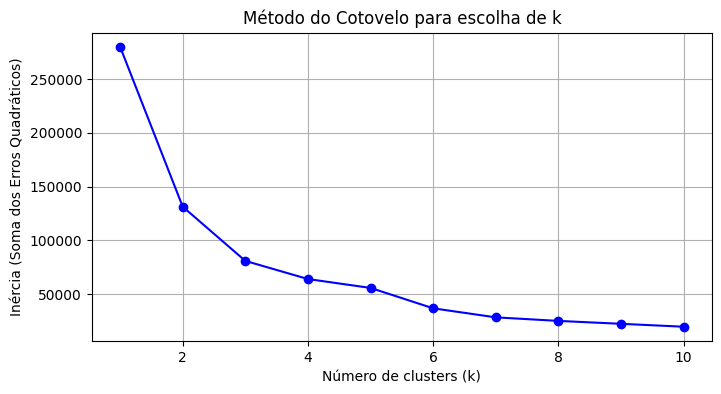

In [114]:
# Testar vários valores de k
inertia = []
K = range(1, 11)

for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(df_scaled)
    inertia.append(kmeans.inertia_)

# Plot do método do cotovelo
plt.figure(figsize=(8, 4))
plt.plot(K, inertia, 'bo-')
plt.xlabel('Número de clusters (k)')
plt.ylabel('Inércia (Soma dos Erros Quadráticos)')
plt.title('Método do Cotovelo para escolha de k')
plt.grid(True)
plt.show()


In [115]:
k = 4  # testei com valores diferentes realmente o melhor do 4
kmeans = KMeans(n_clusters=k, random_state=42)
resumo_customers['cluster'] = kmeans.fit_predict(df_scaled)


In [116]:
# Média das métricas por cluster
resumo_clusters = resumo_customers.groupby('cluster').agg({
    'qty_buys': 'mean',
    'payment_value': 'mean',
    'buy_diff_days': 'mean',
    'customer_unique_id': 'count'
}).reset_index()

display(resumo_clusters)


,cluster,qty_buys,payment_value,buy_diff_days,customer_unique_id
0,0,1.009007,109.620310,729.994874,81932
1,1,2.158391,148.328532,120.614697,2014
2,2,1.005263,492.051334,730.000000,8551
3,3,1.004651,1719.773703,730.000000,860


### Resumo
Com base nos dados disponiveis segmentei os clientes em 4 clusteres:
- Cluster 0 – Compradores ocasionais:<br>sem frequencia e TM baixo
- Cluster 1 – Compradores com potencial recorrencia:<br>frequencia presente e TM baixo
- Cluster 2 – Compradores com carteira média:<br>frequencia baixa - TM médio
- Cluster 3 – Compradores com carteira alta:<br>frequencia baixa e TM alto

Estatégia para marketing:
- Cluster 0 - Manter campanhas aumentar a primeira compra, ofertas para a segunda compra, descontos por quantidade de itens no carrinho.
- Cluster 1 - Fidelização com programas de pontos, e-mails personalizados com base em histórico de compra.
- Cluster 2 - Programa de indicação apra ganha cupom, e-mails personalizados com base em histórico de compra.
- Cluster 3 - Fidelização com Facilidade de pagamento, cartão esclusivo e crédito com base no score, programa de indicação.


### 4. Análise de Satisfação: 
Explore a relação entre a nota de avaliação dos clientes e diferentes aspectos como categoria do produto, tempo de entrega, valor do pedido, etc. Identifique fatores que mais impactam na satisfação do cliente.

#####
para essa análise vou puxar os indicadores já ultilizados para tempo de entrega com indicador de atraso.<br>
tempo até entraga tambem vai entrar como indicador, mesmo que não atrase.<br>
vou fazer uma nuvem de palavras para tentar visualizar as maiores dores dos clientes.

In [117]:
conn = sqlite3.connect('olist.db')

query = """ 
SELECT r.review_id,
        o.order_id,
        JULIANDAY(o.order_delivered_customer_date) - JULIANDAY(o.order_approved_at) AS tempo_entrega,
        JULIANDAY(o.order_estimated_delivery_date) - JULIANDAY(o.order_approved_at) AS tempo_estimado,
        oi.freight_value,
        r.review_score,
        r.review_comment_title,
        r.review_comment_message,
        p.product_category_name,
        p.product_photos_qty,
        sum(p.payment_value) as payment_value,
        r.review_answer_timestamp

FROM orders o
JOIN order_items oi ON o.order_id = oi.order_id
JOIN products p ON p.product_id = oi.product_id
JOIN order_reviews r ON o.order_id = r.order_id
JOIN order_payments p ON p.order_id = o.order_id
GROUP BY o.order_id
ORDER BY r.review_answer_timestamp

; """

df_info_reviews = pd.read_sql_query(query, conn)

df_info_reviews['review_answer_timestamp'] = pd.to_datetime(df_info_reviews['review_answer_timestamp'])
display(df_info_reviews)

,review_id,order_id,tempo_entrega,tempo_estimado,freight_value,review_score,review_comment_title,review_comment_message,product_category_name,product_photos_qty,payment_value,review_answer_timestamp
0,743d98b1a4782f0646898fc915ef002a,e2144124f98f3bf46939bc5183104041,7.000012,50.541389,10.96,4,None,None,bebes,3.0,50.86,2016-10-16 03:20:17
1,53752edb26544dd41c1209f582c9c589,b8b9d7046c083150cb5360b83a8ebb51,11.888171,52.329641,11.80,5,None,O pedido foi entregue antes do prazo pr0metido,eletronicos,3.0,119.79,2016-10-16 15:45:11
2,b2d5d8db2a841d27a72e4c06c6212368,9aa3197e4887919fde0307fc23601d7a,11.125903,52.328484,8.72,4,None,Só chegou uma parte do pedido ate agora..,fashion_bolsas_e_acessorios,4.0,34.62,2016-10-17 21:02:49
3,b5f4bca1dd2976aeb590dfe5d52c06f7,18dad78c0f87f4c45ef196daeaa3ffbb,11.036192,53.336354,14.52,5,None,Tudo dentro do combinado,informatica_acessorios,4.0,58.41,2016-10-18 18:07:44
4,8e8cc3353ea9bd13e1450d8fa269d474,ed3d575bd3358123b063ee64cdecdef5,7.000012,52.139988,8.72,5,None,Chego dentro do prazo tudo bem embalado,esporte_lazer,1.0,30.22,2016-10-18 20:29:05
...,...,...,...,...,...,...,...,...,...,...,...,...
97911,6c50d16eb583d5db7e841b77e89b7045,0b223d92c27432930dfe407c6aea3041,1.079028,5.395058,46.48,5,None,None,moveis_cozinha_area_de_servico_jantar_e_jardim,1.0,1021.92,2018-10-24 16:27:36
97912,abf08328d2f1f0e8a33eee9f52f502f6,99e4a1f9377bf28f08f54a2eecccbf0d,16.480799,30.618218,25.11,5,None,None,beleza_saude,1.0,105.11,2018-10-24 18:26:25
97913,6c883909cf53725a13caf477a70f00a4,7ce4e38f4eadd993bb5b2e60bb7f7bec,7.160231,19.371516,103.12,5,Muito bonita,"Amei a mesinha, que pena que me confundir na c...",moveis_sala,3.0,283.02,2018-10-24 21:34:38
97914,728d5cfdc7283cfd0a8061d7581a19f8,7e8072dc0f35ebb0c1b2a4743e0f179a,12.168472,28.159560,16.74,5,None,None,beleza_saude,1.0,95.74,2018-10-26 21:36:41


In [118]:
# usando mesmas metricas para gerar indicadores de atraso
df_info_reviews['estimado_vs_realizado'] = df_info_reviews['tempo_entrega']-df_info_reviews['tempo_estimado']
df_info_reviews.loc[:, 'atrasado'] = (df_info_reviews['estimado_vs_realizado'] > 0).astype(int)

##### Vou comerçar visualizando os principais comentários (Nuvens de palavras)

In [119]:
from wordcloud import WordCloud
from matplotlib.colors import ListedColormap
import matplotlib.pyplot as plt
from nltk.corpus import stopwords
import string
import nltk
from PIL import Image

In [120]:
df_title = df_info_reviews[['review_comment_title','review_comment_message']].loc[df_info_reviews.review_score > 3]

Avaliaçõesde 4 e 5 estrelas


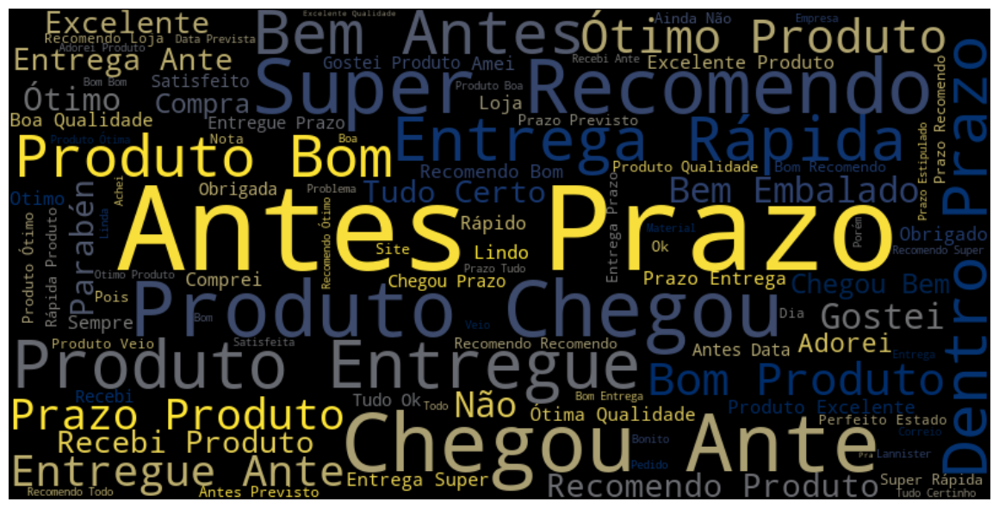

In [148]:
df_title = df_info_reviews.review_comment_title.loc[df_info_reviews.review_score > 3]
df_coment = df_info_reviews.review_comment_message.loc[df_info_reviews.review_score > 3]

lista = df_title.dropna().values
lista = np.append(lista,df_coment.dropna().values, axis=0)



stops = stopwords.words('portuguese')
stops.remove('não')
# Baixando stop words do NLTK
#nltk.download('stopwords')

todo_texto = ' '.join(lista).lower()
# Criação de nova lista de palavras, removendo stop words
palavras_semstop = [p for p in todo_texto.split(' ') if p not in stops]

# Remoção da pontuação, gerando uma lista sem stop words e sem pontuação
palavras_sem_pontuacao = [p for p in palavras_semstop if p not in string.punctuation]

# Criação de nova lista de palavras, sem stopwords e pontuação
todo_texto = ' '.join(palavras_sem_pontuacao).strip().title()


colormap = 'cividis'
# Usar no WordCloud
nuvem = WordCloud(
    background_color='black',
    colormap=colormap,
    contour_color='steelblue',
    contour_width=2,
    max_words=100,
    stopwords=stops,
    width=800,
    height=400
)

nuvem.generate(todo_texto)

plt.figure(figsize=(12, 6))
plt.imshow(nuvem, interpolation='bilinear')
plt.axis('off')
plt.tight_layout()
print('Avaliaçõesde 4 e 5 estrelas')
plt.show()

Avaliações de 1 e 2 estrelas


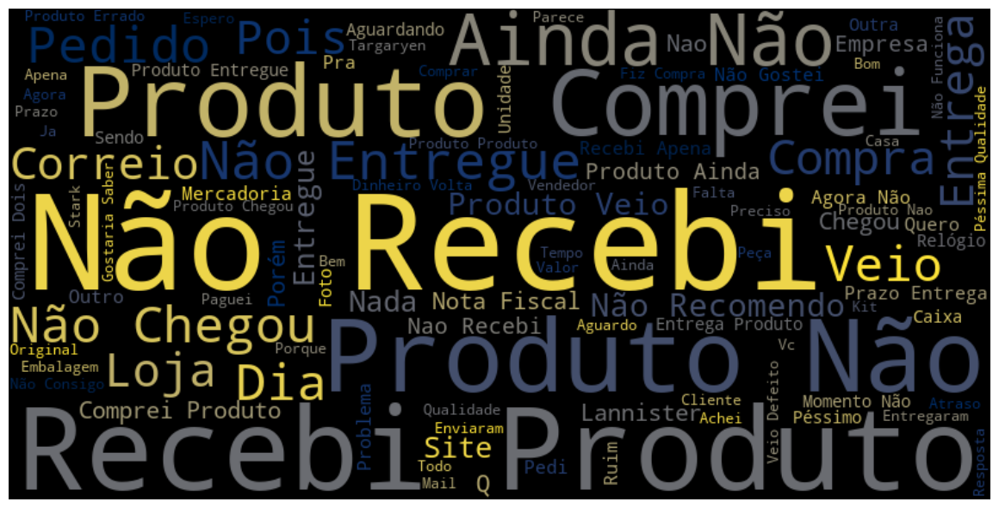

In [144]:
df_title = df_info_reviews.review_comment_title.loc[df_info_reviews.review_score < 3]
df_coment = df_info_reviews.review_comment_message.loc[df_info_reviews.review_score < 3]

lista = df_title.dropna().values
lista = np.append(lista,df_coment.dropna().values, axis=0)



stops = stopwords.words('portuguese')
stops.remove('não')
# Baixando stop words do NLTK
#nltk.download('stopwords')

todo_texto = ' '.join(lista).lower()
# Criação de nova lista de palavras, removendo stop words
palavras_semstop = [p for p in todo_texto.split(' ') if p not in stops]

# Remoção da pontuação, gerando uma lista sem stop words e sem pontuação
palavras_sem_pontuacao = [p for p in palavras_semstop if p not in string.punctuation]

# Criação de nova lista de palavras, sem stopwords e pontuação
todo_texto = ' '.join(palavras_sem_pontuacao).strip().title()


colormap = 'cividis'
# Usar no WordCloud
nuvem = WordCloud(
    background_color='black',
    colormap=colormap,
    contour_color='steelblue',
    contour_width=2,
    max_words=100,
    stopwords=stops,
    width=800,
    height=400
)

nuvem.generate(todo_texto)

plt.figure(figsize=(12, 6))
plt.imshow(nuvem, interpolation='bilinear')
plt.axis('off')
plt.tight_layout()
print('Avaliações de 1 e 2 estrelas')
plt.show()

Avaliações com 3 estrelas


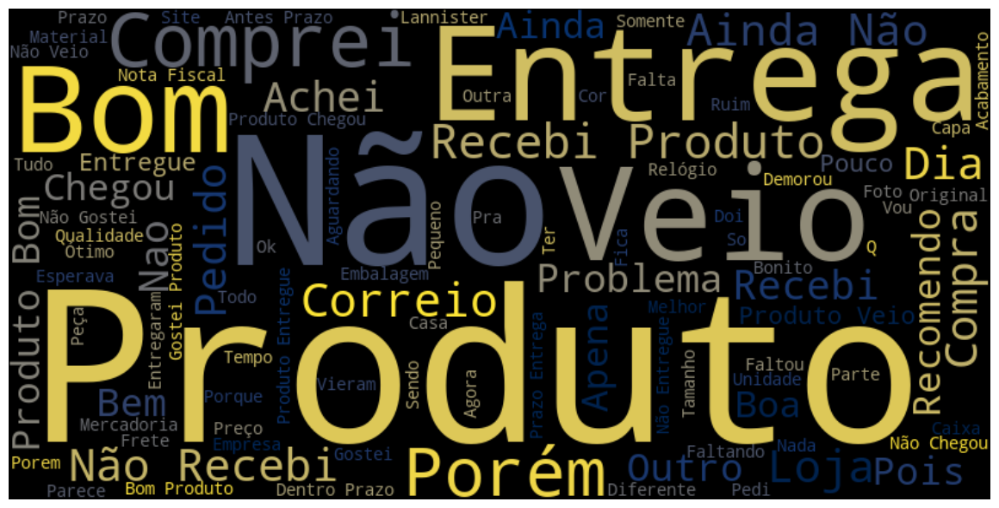

In [150]:
df_title = df_info_reviews.review_comment_title.loc[df_info_reviews.review_score == 3]
df_coment = df_info_reviews.review_comment_message.loc[df_info_reviews.review_score == 3]

lista = df_title.dropna().values
lista = np.append(lista,df_coment.dropna().values, axis=0)



stops = stopwords.words('portuguese')
stops.remove('não')
# Baixando stop words do NLTK
#nltk.download('stopwords')

todo_texto = ' '.join(lista).lower()
# Criação de nova lista de palavras, removendo stop words
palavras_semstop = [p for p in todo_texto.split(' ') if p not in stops]

# Remoção da pontuação, gerando uma lista sem stop words e sem pontuação
palavras_sem_pontuacao = [p for p in palavras_semstop if p not in string.punctuation]

# Criação de nova lista de palavras, sem stopwords e pontuação
todo_texto = ' '.join(palavras_sem_pontuacao).strip().title()


colormap = 'cividis'
# Usar no WordCloud
nuvem = WordCloud(
    background_color='black',
    colormap=colormap,
    contour_color='steelblue',
    contour_width=2,
    max_words=100,
    stopwords=stops,
    width=800,
    height=400
)

nuvem.generate(todo_texto)

plt.figure(figsize=(12, 6))
plt.imshow(nuvem, interpolation='bilinear')
plt.axis('off')
plt.tight_layout()
print('Avaliações com 3 estrelas')
plt.show()

##### Diferença que palavras é nitida e faz referencia a quantidade de estrelas das avaliações

In [124]:
df_info_reviews

,review_id,order_id,tempo_entrega,tempo_estimado,freight_value,review_score,review_comment_title,review_comment_message,product_category_name,product_photos_qty,payment_value,review_answer_timestamp,estimado_vs_realizado,atrasado
0,743d98b1a4782f0646898fc915ef002a,e2144124f98f3bf46939bc5183104041,7.000012,50.541389,10.96,4,None,None,bebes,3.0,50.86,2016-10-16 03:20:17,-43.541377,0
1,53752edb26544dd41c1209f582c9c589,b8b9d7046c083150cb5360b83a8ebb51,11.888171,52.329641,11.80,5,None,O pedido foi entregue antes do prazo pr0metido,eletronicos,3.0,119.79,2016-10-16 15:45:11,-40.441470,0
2,b2d5d8db2a841d27a72e4c06c6212368,9aa3197e4887919fde0307fc23601d7a,11.125903,52.328484,8.72,4,None,Só chegou uma parte do pedido ate agora..,fashion_bolsas_e_acessorios,4.0,34.62,2016-10-17 21:02:49,-41.202581,0
3,b5f4bca1dd2976aeb590dfe5d52c06f7,18dad78c0f87f4c45ef196daeaa3ffbb,11.036192,53.336354,14.52,5,None,Tudo dentro do combinado,informatica_acessorios,4.0,58.41,2016-10-18 18:07:44,-42.300162,0
4,8e8cc3353ea9bd13e1450d8fa269d474,ed3d575bd3358123b063ee64cdecdef5,7.000012,52.139988,8.72,5,None,Chego dentro do prazo tudo bem embalado,esporte_lazer,1.0,30.22,2016-10-18 20:29:05,-45.139977,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
97911,6c50d16eb583d5db7e841b77e89b7045,0b223d92c27432930dfe407c6aea3041,1.079028,5.395058,46.48,5,None,None,moveis_cozinha_area_de_servico_jantar_e_jardim,1.0,1021.92,2018-10-24 16:27:36,-4.316030,0
97912,abf08328d2f1f0e8a33eee9f52f502f6,99e4a1f9377bf28f08f54a2eecccbf0d,16.480799,30.618218,25.11,5,None,None,beleza_saude,1.0,105.11,2018-10-24 18:26:25,-14.137419,0
97913,6c883909cf53725a13caf477a70f00a4,7ce4e38f4eadd993bb5b2e60bb7f7bec,7.160231,19.371516,103.12,5,Muito bonita,"Amei a mesinha, que pena que me confundir na c...",moveis_sala,3.0,283.02,2018-10-24 21:34:38,-12.211285,0
97914,728d5cfdc7283cfd0a8061d7581a19f8,7e8072dc0f35ebb0c1b2a4743e0f179a,12.168472,28.159560,16.74,5,None,None,beleza_saude,1.0,95.74,2018-10-26 21:36:41,-15.991088,0


In [125]:
features = ['review_score','atrasado','estimado_vs_realizado','payment_value','product_photos_qty','freight_value']
features_to_dummies = ['review_score','atrasado','estimado_vs_realizado','payment_value','product_photos_qty','freight_value','product_category_name']

In [126]:
# criando o indicador de categoria de produto
df_info_reviews_dummies = pd.get_dummies(df_info_reviews[features_to_dummies], columns=['product_category_name'], prefix='uf')


In [127]:
df_info_reviews[features].loc[df_info_reviews.review_score > 3].corr()

,review_score,atrasado,estimado_vs_realizado,payment_value,product_photos_qty,freight_value
review_score,1.000000,-0.046758,-0.051466,-0.004983,-0.005479,-0.012615
atrasado,-0.046758,1.000000,0.406838,0.002708,-0.002918,0.014440
estimado_vs_realizado,-0.051466,0.406838,1.000000,-0.026418,0.011244,-0.092065
payment_value,-0.004983,0.002708,-0.026418,1.000000,0.000650,0.287204
product_photos_qty,-0.005479,-0.002918,0.011244,0.000650,1.000000,0.024037
freight_value,-0.012615,0.014440,-0.092065,0.287204,0.024037,1.000000


In [128]:
df_info_reviews[features].loc[df_info_reviews.review_score < 3].corr()

,review_score,atrasado,estimado_vs_realizado,payment_value,product_photos_qty,freight_value
review_score,1.000000,-0.118277,-0.125514,-0.020922,0.008576,-0.008937
atrasado,-0.118277,1.000000,0.773485,-0.044449,0.000021,0.056239
estimado_vs_realizado,-0.125514,0.773485,1.000000,-0.045573,-0.005253,0.043097
payment_value,-0.020922,-0.044449,-0.045573,1.000000,-0.007514,0.114212
product_photos_qty,0.008576,0.000021,-0.005253,-0.007514,1.000000,0.025017
freight_value,-0.008937,0.056239,0.043097,0.114212,0.025017,1.000000


### Resumo
A nuvem de palavras mostrou e os numeros confirmaram:
- Indicador mais for para influenciar a avaliação é o tempo de entrega.
- por mais que a avaliação seja sobre o produto, os cliente levam mais em consideração a pontualidade.

## 4. Visualização e Dashboards

### Um dashboard geral que mostre a evolução das vendas ao longo do tempo, com filtros por estado e categoria de produto


Vou usar um grafico já usado anteriormente, apenas adicionando a informação do estado e categoria<br>
<i>tive que separar os dados em dois dataframes para unir no grafico </i>

In [129]:
conn = sqlite3.connect('olist.db')
query = '''
SELECT 
    strftime('%Y-%m', o.order_purchase_timestamp) AS Mês,
    o.order_id AS Pedidos,
    c.customer_state,
    p.product_category_name

FROM orders o
JOIN customers c ON c.customer_id = o.customer_id
JOIN order_items oi ON oi.order_id = o.order_id
JOIN products p ON p.product_id = oi.product_id

GROUP BY o.order_id
ORDER BY Mês;
'''

df_orders_cat = pd.read_sql_query(query, conn)

display(df_orders_cat)
conn.close()

,Mês,Pedidos,customer_state,product_category_name
0,2016-09,2e7a8482f6fb09756ca50c10d7bfc047,RR,moveis_decoracao
1,2016-09,bfbd0f9bdef84302105ad712db648a6c,SP,beleza_saude
2,2016-09,e5fa5a7210941f7d56d0208e4e071d35,RS,telefonia
3,2016-10,02190241f7190a1f3c7e0df95a749c6a,RJ,brinquedos
4,2016-10,021d08e4057e5b6414c8d2f69f4f72a0,MG,automotivo
...,...,...,...,...
98661,2018-08,ff9de84a5b397156b1f1f216fd5bf074,SP,moveis_sala
98662,2018-08,ffc0249fed109d5d056d7c79b7fa7dd9,SP,automotivo
98663,2018-08,ffdd767d77c3322d78b286b6e8ecaf15,SP,esporte_lazer
98664,2018-08,ffee31fb4b5e35c9123608015637c495,PR,moveis_decoracao


In [130]:
df_estado_mes = df_orders_cat.groupby(['Mês', 'customer_state']) \
                          .agg({'Pedidos': 'count'}) \
                          .reset_index() \
                          .rename(columns={'customer_state': 'Estado'})
df_estado_mes

,Mês,Estado,Pedidos
0,2016-09,RR,1
1,2016-09,RS,1
2,2016-09,SP,1
3,2016-10,AL,2
4,2016-10,BA,4
...,...,...,...
554,2018-08,SC,203
555,2018-08,SE,23
556,2018-08,SP,3218
557,2018-08,TO,13


In [131]:
df_categoria_mes = df_orders_cat.groupby(['Mês', 'product_category_name']) \
                          .agg({'Pedidos': 'count'}) \
                          .reset_index() \
                          .rename(columns={'product_category_name': 'categoria'})
df_categoria_mes

,Mês,categoria,Pedidos
0,2016-09,beleza_saude,1
1,2016-09,moveis_decoracao,1
2,2016-09,telefonia,1
3,2016-10,alimentos,1
4,2016-10,audio,2
...,...,...,...
1253,2018-08,sinalizacao_e_seguranca,16
1254,2018-08,telefonia,246
1255,2018-08,telefonia_fixa,10
1256,2018-08,utilidades_domesticas,558


In [132]:

# Estados e categorias únicos
estados = df_estado_mes['Estado'].unique()
estados.sort()
categorias = df_categoria_mes['categoria'].unique()
categorias.sort()

# Trace total (visível por padrão)
df_total = df_estado_mes.groupby('Mês')['Pedidos'].sum().reset_index()
trace_total = go.Bar(
    x=df_total['Mês'],
    y=df_total['Pedidos'],
    name='Total',
    visible=True
)

# Traces por estado
traces_estado = []
for estado in estados:
    dados_estado = df_estado_mes[df_estado_mes['Estado'] == estado]
    trace = go.Bar(
        x=dados_estado['Mês'],
        y=dados_estado['Pedidos'],
        name=f'Estado: {estado}',
        visible=False
    )
    traces_estado.append(trace)

# Traces por categoria
traces_categoria = []
for categoria in categorias:
    dados_categoria = df_categoria_mes[df_categoria_mes['categoria'] == categoria]
    trace = go.Bar(
        x=dados_categoria['Mês'],
        y=dados_categoria['Pedidos'],
        name=f'Categoria: {categoria}',
        visible=False
    )
    traces_categoria.append(trace)

# Combinar todos os traces
traces = [trace_total] + traces_estado + traces_categoria

# Índices
idx_total = 0
idx_estados_ini = 1
idx_categorias_ini = 1 + len(estados)

# Botões de estado
botoes_estado = []

# Botão "Todos os estados"
visibilidade = [False] * len(traces)
visibilidade[idx_total] = True
botoes_estado.append(dict(
    label='Todos Estados',
    method='update',
    args=[{'visible': visibilidade},
          {'title': 'Pedidos por mês - Todos os estados'}]
))

# Um botão para cada estado
for i, estado in enumerate(estados):
    visibilidade = [False] * len(traces)
    visibilidade[idx_estados_ini + i] = True
    botoes_estado.append(dict(
        label=estado,
        method='update',
        args=[{'visible': visibilidade},
              {'title': f'Pedidos por mês - Estado: {estado}'}]
    ))

# Botões de categoria
botoes_categoria = []

# Botão "Todas categorias"
visibilidade = [False] * len(traces)
visibilidade[idx_total] = True
botoes_categoria.append(dict(
    label='Todas Categorias',
    method='update',
    args=[{'visible': visibilidade},
          {'title': 'Pedidos por mês - Todas as categorias'}]
))

# Um botão para cada categoria
for i, categoria in enumerate(categorias):
    visibilidade = [False] * len(traces)
    visibilidade[idx_categorias_ini + i] = True
    botoes_categoria.append(dict(
        label=categoria,
        method='update',
        args=[{'visible': visibilidade},
              {'title': f'Pedidos por mês - Categoria: {categoria}'}]
    ))

# Criar a figura
fig_estado = go.Figure(data=traces)

# Layout com dropdowns
fig_estado.update_layout(
    title='Pedidos por mês - Todos os estados',
    xaxis_title='Mês', yaxis_title='Quantidade de pedidos',
    updatemenus=[
        dict(
            buttons=botoes_estado, direction='down', showactive=True, x=1.1, xanchor='left', y=1.15, yanchor='top'
        ),
        dict(
            buttons=botoes_categoria, direction='down', showactive=True, x=1.1, xanchor='left', y=1.0, yanchor='top'
        )],
    width=1200,height=500,
    plot_bgcolor='white'
)

fig_estado.show()


### Um mapa de calor mostrando a concentração de vendas por região/estado do Brasil


In [133]:

conn = sqlite3.connect('olist.db')
query = '''
SELECT 
    o.order_id,
    c.customer_id,
    c.customer_state,
    c.customer_zip_code_prefix,
    gc.customer_lat,
    gc.customer_lng
FROM orders AS o
JOIN customers AS c ON o.customer_id = c.customer_id
LEFT JOIN (
    SELECT geolocation_zip_code_prefix, 
           AVG(geolocation_lat) AS customer_lat, 
           AVG(geolocation_lng) AS customer_lng
    FROM geolocation
    GROUP BY geolocation_zip_code_prefix
) AS gc ON c.customer_zip_code_prefix = gc.geolocation_zip_code_prefix
;
'''

df_customers_geo = pd.read_sql_query(query, conn)
display(df_customers_geo)
conn.close()

,order_id,customer_id,customer_state,customer_zip_code_prefix,customer_lat,customer_lng
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,SP,3149,-23.576983,-46.587161
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,BA,47813,-12.177924,-44.660711
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,GO,75265,-16.745150,-48.514783
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,RN,59296,-5.774190,-35.271143
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,SP,9195,-23.676370,-46.514627
...,...,...,...,...,...,...
99436,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,SP,12209,-23.178000,-45.883818
99437,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,SP,11722,-24.001500,-46.449864
99438,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,BA,45920,-17.898358,-39.373630
99439,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,RJ,28685,-22.562825,-42.694574


In [134]:
fig = px.density_map(df_customers_geo,
    lat='customer_lat', 
    lon='customer_lng',
z=None,
hover_name=None,
hover_data=None,
custom_data=None,
animation_frame=None,
animation_group=None,
category_orders=None,
labels=None,
color_continuous_scale='YlOrRd',
range_color=None,
color_continuous_midpoint=None,
opacity=0.6,
zoom=3.5,
center=dict(lat=-14.2350, lon=-56.9253),
map_style='carto-darkmatter',
radius=2,
title='Mapa de Calor de Vendas por Localização (Olist)',
subtitle=None,
template=None,
width=None,
height=None)
# Ajuste de layout
fig.update_layout(
    height=800,
    width=1200,
    margin=dict(l=10, r=10, t=50, b=10),
    title_x=0.5  # centraliza o título
)

fig.show()
# agradecimento: https://plotly.com/python-api-reference/generated/plotly.express.density_map.html

### Um conjunto de gráficos que apresente a relação entre avaliação do cliente e tempo de entrega

In [135]:
conn = sqlite3.connect('olist.db')

query = """ 
SELECT distinct(o.order_id),
        JULIANDAY(o.order_delivered_customer_date) - JULIANDAY(o.order_approved_at) AS tempo_entrega,
        JULIANDAY(o.order_estimated_delivery_date) - JULIANDAY(o.order_approved_at) AS tempo_estimado,
        r.review_score
FROM orders o
JOIN order_reviews r ON o.order_id = r.order_id
GROUP BY o.order_id

; """

df_reviews_vs_entrega = pd.read_sql_query(query, conn)
df_reviews_vs_entrega['estimado_vs_realizado'] = df_reviews_vs_entrega['tempo_entrega']-df_reviews_vs_entrega['tempo_estimado']
display(df_reviews_vs_entrega)

,order_id,tempo_entrega,tempo_estimado,review_score,estimado_vs_realizado
0,00010242fe8c5a6d1ba2dd792cb16214,7.582095,15.593345,5,-8.011250
1,00018f77f2f0320c557190d7a144bdd3,16.207766,18.538044,4,-2.330278
2,000229ec398224ef6ca0657da4fc703e,7.938032,21.382986,5,-13.444954
3,00024acbcdf0a6daa1e931b038114c75,6.140521,11.576181,4,-5.435660
4,00042b26cf59d7ce69dfabb4e55b4fd9,25.105764,40.409572,5,-15.303808
...,...,...,...,...,...
98668,fffc94f6ce00a00581880bf54a75a037,15.781701,22.825683,5,-7.043981
98669,fffcd46ef2263f404302a634eb57f7eb,6.666748,14.811250,5,-8.144502
98670,fffce4705a9662cd70adb13d4a31832d,3.797188,16.281655,5,-12.484468
98671,fffe18544ffabc95dfada21779c9644f,1.913287,9.996852,5,-8.083565


In [136]:

# Criação do trace 2D
trace = go.Scatter(
    x=df_reviews_vs_entrega['estimado_vs_realizado'],
    y=df_reviews_vs_entrega['review_score'],
    mode='markers',
    marker=dict(
        size=8,
        color=df_reviews_vs_entrega['review_score'],
        colorscale='Viridis',
        opacity=0.8,
        colorbar=dict(title='Review Score')
    ),
    hovertemplate=(
        'Review Score: %{x}<br>'
        'Prazo estimado vs Entrega: %{y}<'
    )
)

# Layout 2D
layout = go.Layout(
    title='2D Scatter Plot de Clientes',
    xaxis=dict(title='Dias Estimado vs Real'),
    yaxis=dict(title='Review Score'),
    height=700,
    width=1000,
    plot_bgcolor='white'
)

# Construção da figura
fig = go.Figure(data=[trace], layout=layout)
fig.show()


### Um dashboard de análise dos vendedores, mostrando quais têm melhor desempenho em termos de volume de vendas, satisfação do cliente e tempo de entrega

In [3]:


# Conectar ao banco de dados SQLite
conn = sqlite3.connect('olist.db')

query = """
    SELECT s.seller_id,
        COUNT(o.order_id) AS volume_vendas,
        AVG(r.review_score) AS satisfacao_cliente,
        AVG(julianday(o.order_delivered_customer_date) - julianday(o.order_purchase_timestamp)) AS tempo_entrega,
        AVG((JULIANDAY(o.order_delivered_customer_date) - JULIANDAY(o.order_approved_at) )-( JULIANDAY(o.order_estimated_delivery_date) - JULIANDAY(o.order_approved_at))) AS entrega_vs_estimado,
        AVG(JULIANDAY(o.order_delivered_carrier_date) - JULIANDAY(o.order_approved_at)) AS dias_em_preparacao
    FROM orders o
    JOIN order_reviews r ON o.order_id = r.order_id
    JOIN order_items oi ON oi.order_id = o.order_id
    JOIN products p ON p.product_id == oi.product_id
    JOIN sellers s ON oi.seller_id = s.seller_id
    WHERE o.order_status = 'delivered'
    GROUP BY s.seller_id
;"""
# Consultar dados
df_sallers = pd.read_sql_query(query, conn)

# Fechar a conexão
conn.close()

# Exibir os dados
display(df_sallers)


,seller_id,volume_vendas,satisfacao_cliente,tempo_entrega,entrega_vs_estimado,dias_em_preparacao
0,0015a82c2db000af6aaaf3ae2ecb0532,3,3.666667,10.793885,-15.593380,2.804352
1,001cca7ae9ae17fb1caed9dfb1094831,231,3.965368,12.854012,-12.899277,2.190987
2,002100f778ceb8431b7a1020ff7ab48f,55,4.036364,16.045593,-7.430931,3.512568
3,003554e2dce176b5555353e4f3555ac8,1,5.000000,4.646806,-26.066794,0.523623
4,004c9cd9d87a3c30c522c48c4fc07416,172,4.145349,14.722822,-10.918514,1.364416
...,...,...,...,...,...,...
2960,ffc470761de7d0232558ba5e786e57b7,30,4.300000,10.081843,-11.001344,1.096223
2961,ffdd9f82b9a447f6f8d4b91554cc7dd3,20,4.250000,10.324113,-11.460639,4.053417
2962,ffeee66ac5d5a62fe688b9d26f83f534,14,4.214286,18.074881,-7.662858,6.152881
2963,fffd5413c0700ac820c7069d66d98c89,57,3.912281,13.435269,-10.871422,1.974425


In [4]:
import plotly.express as px

fig = px.scatter_3d(df_sallers,
                    x='volume_vendas',
                    y='satisfacao_cliente',
                    z='tempo_entrega',
                    hover_name='seller_id',
                    color='volume_vendas',
                    size='volume_vendas',
                    title='Desempenho dos Vendedores - Volume x Satisfação x Entrega',
                    color_continuous_scale='Viridis')

fig.update_layout(
    scene=dict(
        xaxis_title='Volume de Vendas',
        yaxis_title='Satisfação do Cliente',
        zaxis_title='Tempo de Entrega (dias)'
    ),
    height=800,
    width=1200
)

fig.show()


Nesse grafica de dispersão em 3D, conseguimos identifica vendedores com alto voluma de vendas, notas de satifações aceitaveis e tempo de entrada satisfatório

Agora vamos criar indicadores para ranquear esse vendedores

In [5]:
# Normalizando os dados para rankear os vendedores 
df_sallers['volume_norm'] = (df_sallers['volume_vendas'] - df_sallers['volume_vendas'].min()) / (df_sallers['volume_vendas'].max() - df_sallers['volume_vendas'].min())
df_sallers['satisfacao_norm'] = (df_sallers['satisfacao_cliente'] - df_sallers['satisfacao_cliente'].min()) / (df_sallers['satisfacao_cliente'].max() - df_sallers['satisfacao_cliente'].min())
df_sallers['entrega_norm'] = 1 - ((df_sallers['tempo_entrega'] - df_sallers['tempo_entrega'].min()) / (df_sallers['tempo_entrega'].max() - df_sallers['tempo_entrega'].min()))

# calculando a pontuação
df_sallers['pontuacao_desempenho'] = (df_sallers['volume_norm'] + df_sallers['satisfacao_norm'] + df_sallers['entrega_norm']) / 3
df_sallers_ordenado = df_sallers.sort_values(by='pontuacao_desempenho', ascending=False)


In [6]:
df_sallers_ordenado

,seller_id,volume_vendas,satisfacao_cliente,tempo_entrega,entrega_vs_estimado,dias_em_preparacao,volume_norm,satisfacao_norm,entrega_norm,pontuacao_desempenho
1188,6560211a19b47992c3666cc44a7e94c0,1985,3.951637,9.542621,-11.040620,1.196218,1.000000,0.737909,0.955852,0.897920
358,1f50f920176fa81dab994f9023523100,1927,3.987545,15.437202,-10.198338,3.371663,0.970766,0.746886,0.924606,0.880753
857,4a3ca9315b744ce9f8e9374361493884,1949,3.828630,14.411429,-8.962581,2.354351,0.981855,0.707158,0.930043,0.873019
2383,cc419e0650a3c5ba77189a1882b7556a,1755,4.145869,11.579367,-12.327548,2.399855,0.884073,0.786467,0.945056,0.871865
2538,da8622b14eb17ae2831f4ac5b9dab84a,1565,4.075399,11.128971,-10.654535,2.305543,0.788306,0.768850,0.947443,0.834866
...,...,...,...,...,...,...,...,...,...,...
713,3da38366e7bd9baf6369071f782ecdf0,1,1.000000,53.348426,6.915891,22.507477,0.000000,0.000000,0.723644,0.241215
1581,8629a7efec1aab257e58cda559f03ba7,1,1.000000,59.226678,33.807859,25.272222,0.000000,0.000000,0.692484,0.230828
1043,586a871d4f1221763fddb6ceefdeb95e,2,1.000000,68.621146,22.593727,48.215069,0.000504,0.000000,0.642686,0.214397
1677,8e670472e453ba34a379331513d6aab1,1,1.000000,86.001169,35.714699,61.150509,0.000000,0.000000,0.550557,0.183519


In [7]:
import plotly.express as px

# 
# Ordenar os vendedores pelo volume de vendas e selecionar os top 10
df_sallers_top10 = df_sallers.sort_values(by='volume_vendas', ascending=False).head(10)

# Criar o gráfico de barras
fig = px.bar(
    df_sallers_top10,
    x='seller_id',
    y='volume_vendas',
    color='satisfacao_cliente',
    color_continuous_scale='Blues',
    hover_data={
        'tempo_entrega': ':.2f',
        'satisfacao_cliente': ':.2f',
        'volume_vendas': True
    },
    labels={
        'seller_id': 'Vendedor',
        'volume_vendas': 'Volume de Vendas',
        'satisfacao_cliente': 'Satisfação do Cliente',
        'tempo_entrega': 'Tempo de Entrega (dias)'
    },
    title='Top 10 Vendedores por Volume de Vendas'
)

# Atualizar o layout do gráfico
fig.update_layout(
    xaxis_title='ID do Vendedor',
    yaxis_title='Volume de Vendas',
    coloraxis_colorbar=dict(title='Satisfação Média'),
    height=600,
    width=1200
)

# Exibir o gráfico
fig.show()


# -